# **Importing libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import xgboost as xgb
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer


# **Dataframe**

In [ ]:
df_tier4 = pd.read_csv('drive/MyDrive/Dissertation/df_tier4_Visuals_10yrs.csv')

In [ ]:
df_tier4.dtypes

Unnamed: 0                          int64
unique_id                          object
deed_date                          object
day                                 int64
month                               int64
year                                int64
quarter                             int64
property_type                      object
new_build                          object
estate_type                        object
transaction_category               object
town                               object
district                           object
county                             object
postcode                           object
Latitude                          float64
Longitude                         float64
price_paid                          int64
nearest_bus_stop_distance         float64
count_bus_stops_within_500m         int64
count_bus_stops_within_1km          int64
count_bus_stops_within_2km          int64
nearest_rail_distance             float64
count_rail_station_within_500m    

In [ ]:
district_counts = df_tier4['district'].value_counts()
print(district_counts)

district
26    55146
31    54757
27    53442
1     47155
24    43902
15    42721
16    39767
8     39653
3     38772
21    36972
9     36155
12    35882
32    35519
2     34273
25    33511
18    31852
22    30911
19    30625
20    28926
10    28432
4     28275
23    27641
17    27428
7     26237
6     26213
30    25518
14    24141
5     23509
11    22342
28    21804
0     21208
13    14909
29     2528
Name: count, dtype: int64


In [ ]:
# Drop the "Unnamed: 0" and "unique_id" columns
df_tier4.drop(["Unnamed: 0", "unique_id"], axis=1, inplace=True)

In [ ]:
df_tier4

,deed_date,day,month,year,quarter,property_type,new_build,estate_type,transaction_category,town,...,count_rail_station_within_2km,nearest_supermart_distance,count_supermart_within_500m,count_supermart_within_1km,count_supermart_within_2km,GDP,employment rate,unemployment rate,inflation rate,interest rate
0,2014-01-01,1,1,2014,1,F,N,L,A,LONDON,...,3,0.007168,0,1,8,0.8,72.3,6.9,1.8,0.50
1,2014-01-01,1,1,2014,1,T,N,F,A,LONDON,...,8,0.006832,0,6,22,0.8,72.3,6.9,1.8,0.50
2,2014-01-01,1,1,2014,1,F,Y,L,A,LONDON,...,9,0.000882,5,11,33,0.8,72.3,6.9,1.8,0.50
3,2014-01-01,1,1,2014,1,S,N,F,A,TWICKENHAM,...,2,0.005010,0,1,10,0.8,72.3,6.9,1.8,0.50
4,2014-01-02,2,1,2014,1,F,N,L,B,LONDON,...,3,0.005919,0,3,12,0.8,72.3,6.9,1.8,0.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1070121,2023-12-22,22,12,2023,4,F,N,L,A,BROMLEY,...,5,0.001106,1,2,12,-0.3,75.0,3.9,4.2,5.25
1070122,2023-12-22,22,12,2023,4,F,N,L,A,UXBRIDGE,...,1,0.006574,0,2,8,-0.3,75.0,3.9,4.2,5.25
1070123,2023-12-27,27,12,2023,4,F,N,L,A,LONDON,...,2,0.003248,1,4,12,-0.3,75.0,3.9,4.2,5.25
1070124,2023-12-27,27,12,2023,4,F,N,L,A,LONDON,...,1,0.010108,0,0,4,-0.3,75.0,3.9,4.2,5.25


# **Label Encoding**

In [ ]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Initialize a dictionary to store label encoded values
encoded_values = {}

# Iterate over each column in the DataFrame
for feature in df_tier4.columns:
    if df_tier4[feature].dtype == 'object':
        # Encode the categorical variable
        df_tier4[feature] = label_encoder.fit_transform(df_tier4[feature])

        # Store the encoded values in the dictionary
        encoded_values[feature] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Display the DataFrame after label encoding
print(df_tier4.head())

# Display the dictionary containing encoded values
print(encoded_values)



   deed_date  day  month  year  quarter  property_type  new_build  \
0          0    1      1  2014        1              1          0   
1          0    1      1  2014        1              4          0   
2          0    1      1  2014        1              1          1   
3          0    1      1  2014        1              3          0   
4          1    2      1  2014        1              1          0   

   estate_type  transaction_category  town  ...  \
0            1                     0    42  ...   
1            0                     0    42  ...   
2            1                     0    42  ...   
3            0                     0    72  ...   
4            1                     1    42  ...   

   count_rail_station_within_2km  nearest_supermart_distance  \
0                              3                    0.007168   
1                              8                    0.006832   
2                              9                    0.000882   
3                     

In [ ]:
encoded_values


{}

In [ ]:
df_tier4

,deed_date,day,month,year,quarter,property_type,new_build,estate_type,transaction_category,town,...,count_rail_station_within_2km,nearest_supermart_distance,count_supermart_within_500m,count_supermart_within_1km,count_supermart_within_2km,GDP,employment rate,unemployment rate,inflation rate,interest rate
0,0,1,1,2014,1,1,0,1,0,42,...,3,0.007168,0,1,8,0.8,72.3,6.9,1.8,0.50
1,0,1,1,2014,1,4,0,0,0,42,...,8,0.006832,0,6,22,0.8,72.3,6.9,1.8,0.50
2,0,1,1,2014,1,1,1,1,0,42,...,9,0.000882,5,11,33,0.8,72.3,6.9,1.8,0.50
3,0,1,1,2014,1,3,0,0,0,72,...,2,0.005010,0,1,10,0.8,72.3,6.9,1.8,0.50
4,1,2,1,2014,1,1,0,1,1,42,...,3,0.005919,0,3,12,0.8,72.3,6.9,1.8,0.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1070121,3416,22,12,2023,4,1,0,1,0,11,...,5,0.001106,1,2,12,-0.3,75.0,3.9,4.2,5.25
1070122,3416,22,12,2023,4,1,0,1,0,74,...,1,0.006574,0,2,8,-0.3,75.0,3.9,4.2,5.25
1070123,3417,27,12,2023,4,1,0,1,0,42,...,2,0.003248,1,4,12,-0.3,75.0,3.9,4.2,5.25
1070124,3417,27,12,2023,4,1,0,1,0,42,...,1,0.010108,0,0,4,-0.3,75.0,3.9,4.2,5.25


# **selecting target and features variable**

In [ ]:
# Define target variable
target = 'price_paid'

# Define feature variables (excluding the target variable)
features = df_tier4.columns[df_tier4.columns != target].tolist()


# **Splitting the dataset**

In [ ]:
# Ensure data is sorted by date
df_tier4 = df_tier4.sort_values(by=['year', 'month', 'day'])

# Splitting data into training and testing sets
train_size = int(0.7 * len(df_tier4))
train_data = df_tier4[:train_size]
test_data = df_tier4[train_size:]

# Define features and target variable
X_train = train_data.drop(columns=['price_paid'])
y_train = train_data['price_paid']
X_test = test_data.drop(columns=['price_paid'])
y_test = test_data['price_paid']

# **Linear Regression**

In [ ]:
# Initialize and train the Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Model evaluation
y_pred = lr_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print("R-squared:", r2)
print("Root Mean Squared Error:", rmse)
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

R-squared: 0.25728543454939834
Root Mean Squared Error: 271324.8833516204
Mean Squared Error: 73617192325.77043
Mean Absolute Error: 191584.20711943874


## **Cross validation**

In [ ]:
# Define custom scoring functions for R-squared, RMSE, MSE, and MAE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Make scorer objects for each custom scoring function
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(rmse, greater_is_better=False)  # RMSE is better when lower
mse_scorer = make_scorer(mse, greater_is_better=False)    # MSE is better when lower
mae_scorer = make_scorer(mae, greater_is_better=False)    # MAE is better when lower

# Perform cross-validation with custom scoring functions
cv_scores = cross_val_score(lr_model, X_train, y_train, cv=5, scoring='r2')
cv_r2 = cross_val_score(lr_model, X_train, y_train, cv=5, scoring=r2_scorer)
cv_rmse = -cross_val_score(lr_model, X_train, y_train, cv=5, scoring=rmse_scorer)
cv_mse = -cross_val_score(lr_model, X_train, y_train, cv=5, scoring=mse_scorer)
cv_mae = -cross_val_score(lr_model, X_train, y_train, cv=5, scoring=mae_scorer)

# Print the cross-validation scores
print("Cross-Validation Scores:", cv_scores)
print("Cross-Validation R-squared:", cv_r2)
print("Mean R-squared:", np.mean(cv_r2))
print("Cross-Validation RMSE:", cv_rmse)
print("Mean RMSE:", np.mean(cv_rmse))
print("Cross-Validation MSE:", cv_mse)
print("Mean MSE:", np.mean(cv_mse))
print("Cross-Validation MAE:", cv_mae)
print("Mean MAE:", np.mean(cv_mae))

Cross-Validation Scores: [0.28040167 0.31046844 0.27604473 0.28132723 0.28480348]
Cross-Validation R-squared: [0.28040167 0.31046844 0.27604473 0.28132723 0.28480348]
Mean R-squared: 0.2866091080031089
Cross-Validation RMSE: [251347.11123617 244527.7585439  254764.40576351 252894.68912716
 258640.27390049]
Mean RMSE: 252434.84771424517
Cross-Validation MSE: [6.31753703e+10 5.97938247e+10 6.49049024e+10 6.39557238e+10
 6.68947913e+10]
Mean MSE: 63744922508.269455
Cross-Validation MAE: [180015.90523264 166311.57006179 176965.34495015 176517.13280603
 179774.58294011]
Mean MAE: 175916.90719814316


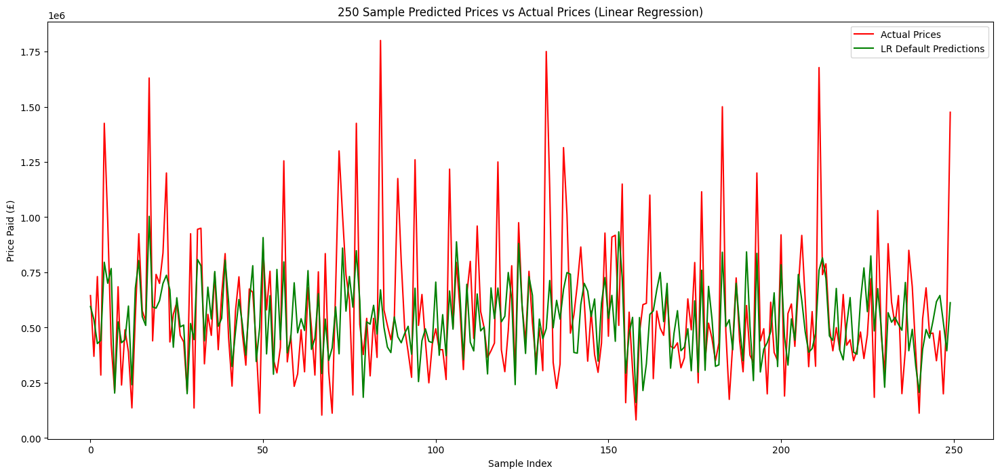

In [ ]:
# Randomly select 250 samples from the test set
np.random.seed(42)
sample_indices = np.random.choice(len(y_test), size=250, replace=False)
sample_y_test = y_test.iloc[sample_indices]
sample_y_pred = y_pred[sample_indices]

# Plot the sample of predicted prices versus actual prices
plt.figure(figsize=(18, 8))
plt.plot(range(len(sample_y_test)), sample_y_test, label='Actual Prices', color='red')
plt.plot(range(len(sample_y_test)), sample_y_pred, label='LR Default Predictions', color='green')
plt.xlabel('Sample Index')
plt.ylabel('Price Paid (£)')
plt.title('250 Sample Predicted Prices vs Actual Prices (Linear Regression)')
plt.legend()
plt.show()

# **XGBoost**

# **Default**

In [ ]:
# Train XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=5, learning_rate=0.1)

In [ ]:
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# Make predictions on the test set
y_pred_default = xgb_model.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred_default)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_default)
mae = mean_absolute_error(y_test, y_pred_default)

print("Test R-squared:", r2)
print("Test RMSE:", rmse)
print("Test MSE:", mse)
print("Test MAE:", mae)

Test R-squared: 0.52911756413358
Test RMSE: 216040.3639071451
Test MSE: 46673438837.13169
Test MAE: 143840.75295623104


## **Features importance**

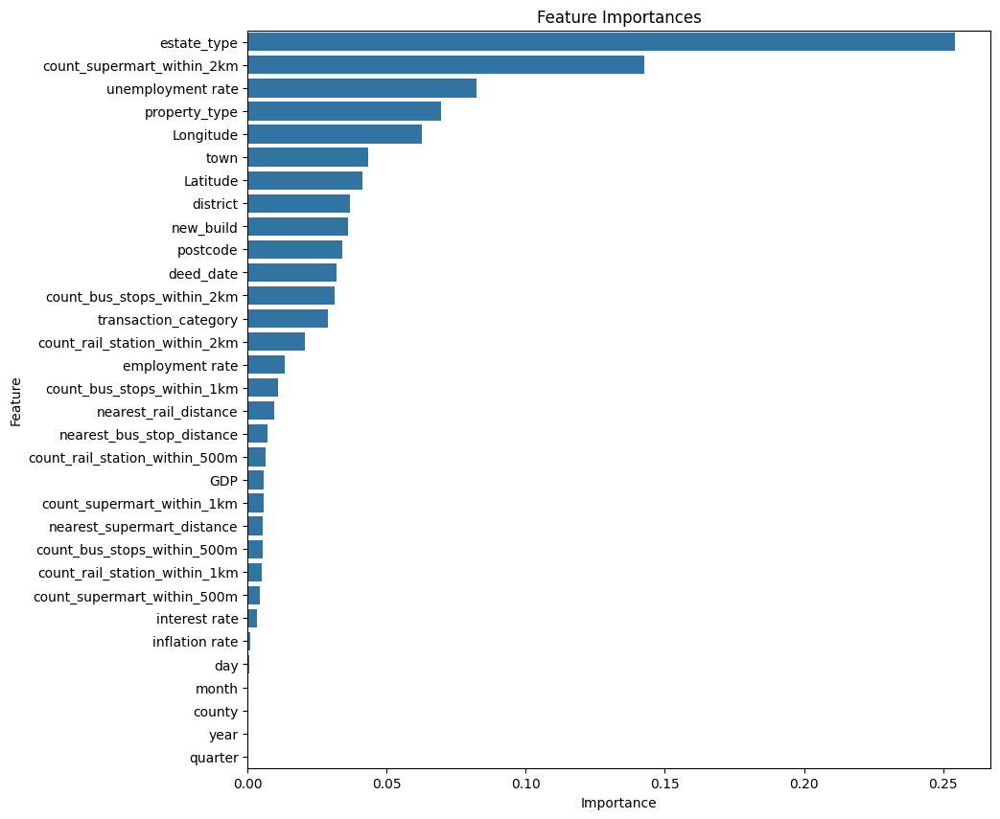

In [ ]:
# Obtain feature importances
feature_importances = xgb_model.feature_importances_

# Create a DataFrame to store feature importances along with their names
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importances
plt.figure(figsize=(10, 10))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## **Cross Validation**

In [ ]:
# Define custom scoring functions for R-squared, RMSE, MSE, and MAE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Make scorer objects for each custom scoring function
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(rmse, greater_is_better=False)  # RMSE is better when lower
mse_scorer = make_scorer(mse, greater_is_better=False)    # MSE is better when lower
mae_scorer = make_scorer(mae, greater_is_better=False)    # MAE is better when lower

# Perform cross-validation with custom scoring functions
cv_r2 = cross_val_score(xgb_model, X_train, y_train, cv=5, scoring=r2_scorer)
cv_rmse = -cross_val_score(xgb_model, X_train, y_train, cv=5, scoring=rmse_scorer)
cv_mse = -cross_val_score(xgb_model, X_train, y_train, cv=5, scoring=mse_scorer)
cv_mae = -cross_val_score(xgb_model, X_train, y_train, cv=5, scoring=mae_scorer)

# Print the cross-validation scores
print("Cross-Validation R-squared:", cv_r2)
print("Mean R-squared:", np.mean(cv_r2))
print("Cross-Validation RMSE:", cv_rmse)
print("Mean RMSE:", np.mean(cv_rmse))
print("Cross-Validation MSE:", cv_mse)
print("Mean MSE:", np.mean(cv_mse))
print("Cross-Validation MAE:", cv_mae)
print("Mean MAE:", np.mean(cv_mae))


Cross-Validation R-squared: [0.56617042 0.57238025 0.52967033 0.52287073 0.52602926]
Mean R-squared: 0.5434241971210799
Cross-Validation RMSE: [195158.91951639 192566.16001128 205344.97096744 206059.26367324
 210551.92739159]
Mean RMSE: 201936.2483119891
Cross-Validation MSE: [3.80870039e+10 3.70817260e+10 4.21665571e+10 4.24604201e+10
 4.43321141e+10]
Mean MSE: 40825564244.7574
Cross-Validation MAE: [130922.8515188  124070.48973567 134044.49555711 134319.15423056
 139522.54431385]
Mean MAE: 132575.90707119863


# **Optimization**

In [ ]:
# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001]
}

# Instantiate XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror')

# Perform grid search cross-validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300}


In [ ]:
# Evaluate the best model on the holdout test set
best_xgb_model = grid_search.best_estimator_
y_pred_optimized = best_xgb_model.predict(X_test)

r2 = r2_score(y_test, y_pred_optimized)
mse = mean_squared_error(y_test, y_pred_optimized)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_optimized)

print("Test R-squared:", r2)
print("Test RMSE:", rmse)
print("Test MSE:", mse)
print("Test MAE:", mae)

Test R-squared: 0.6069985931584816
Test RMSE: 197367.53041669878
Test MSE: 38953942062.78652
Test MAE: 131680.04328435223


In [ ]:
import xgboost as xgb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Initialize a new XGBoost model with the best hyperparameters
best_xgb_model = xgb.XGBRegressor(
    learning_rate=0.1,
    max_depth=7,
    n_estimators=300
)

# Train the model on your training data
best_xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_optimized = best_xgb_model.predict(X_test)

# Evaluate the model performance
r2 = r2_score(y_test, y_pred_optimized)
mse = mean_squared_error(y_test, y_pred_optimized)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_optimized)

# Print the evaluation metrics
print("Test R-squared:", r2)
print("Test RMSE:", rmse)
print("Test MSE:", mse)
print("Test MAE:", mae)

Test R-squared: 0.6069985931584816
Test RMSE: 197367.53041669878
Test MSE: 38953942062.78652
Test MAE: 131680.04328435223


## **Features importance**

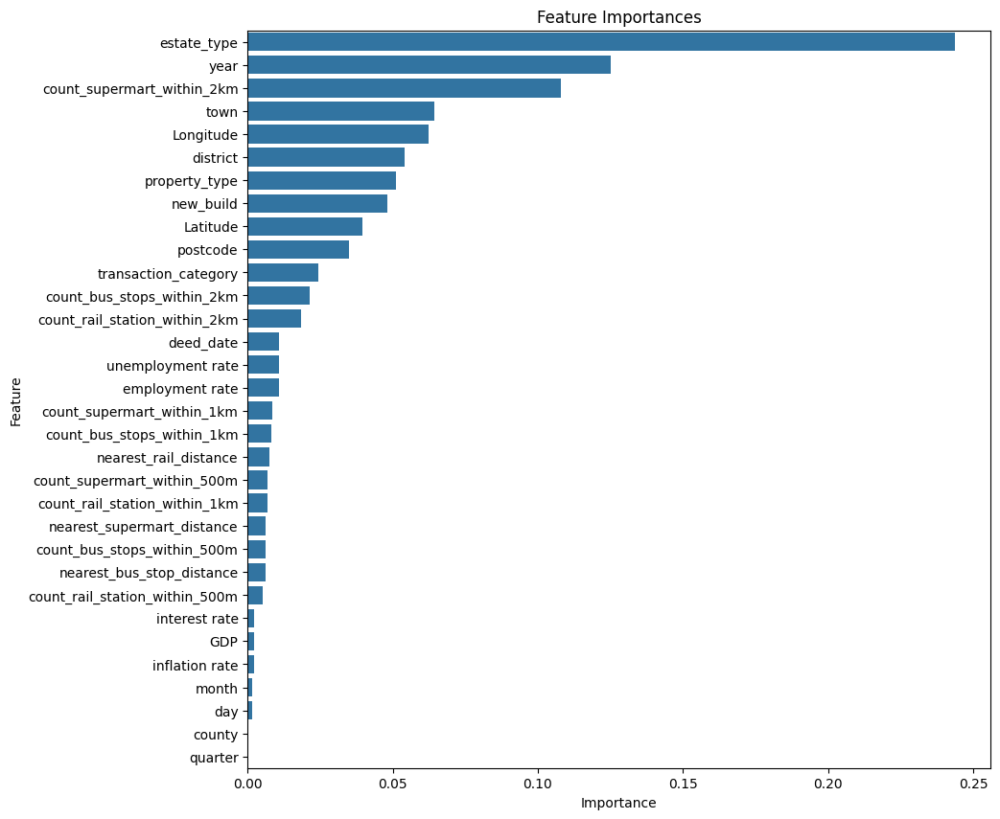

In [ ]:
# Obtain feature importances
feature_importances = best_xgb_model.feature_importances_

# Create a DataFrame to store feature importances along with their names
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importances
plt.figure(figsize=(10, 10))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## **Cross validation**

In [ ]:
# Define custom scoring functions for R-squared, RMSE, MSE, and MAE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Make scorer objects for each custom scoring function
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(rmse, greater_is_better=False)  # RMSE is better when lower
mse_scorer = make_scorer(mse, greater_is_better=False)    # MSE is better when lower
mae_scorer = make_scorer(mae, greater_is_better=False)    # MAE is better when lower

# Perform cross-validation with custom scoring functions
cv_scores = cross_val_score(best_xgb_model, X_train, y_train, cv=5, scoring='r2')
cv_r2 = cross_val_score(best_xgb_model, X_train, y_train, cv=5, scoring=r2_scorer)
cv_rmse = -cross_val_score(best_xgb_model, X_train, y_train, cv=5, scoring=rmse_scorer)
cv_mse = -cross_val_score(best_xgb_model, X_train, y_train, cv=5, scoring=mse_scorer)
cv_mae = -cross_val_score(best_xgb_model, X_train, y_train, cv=5, scoring=mae_scorer)

# Print the cross-validation scores
print("Cross-Validation Scores:", cv_scores)
print("Cross-Validation R-squared:", cv_r2)
print("Mean R-squared:", np.mean(cv_r2))
print("Cross-Validation RMSE:", cv_rmse)
print("Mean RMSE:", np.mean(cv_rmse))
print("Cross-Validation MSE:", cv_mse)
print("Mean MSE:", np.mean(cv_mse))
print("Cross-Validation MAE:", cv_mae)
print("Mean MAE:", np.mean(cv_mae))

Cross-Validation Scores: [0.65504374 0.65259047 0.60733475 0.60300056 0.58754015]
Cross-Validation R-squared: [0.65504374 0.65259047 0.60733475 0.60300056 0.58754015]
Mean R-squared: 0.6211019351015648
Cross-Validation RMSE: [174024.67874501 173568.91778266 187626.47338836 187961.56815025
 196414.83802754]
Mean RMSE: 183919.29521876576
Cross-Validation MSE: [3.02845888e+10 3.01261692e+10 3.52036935e+10 3.53295511e+10
 3.85787886e+10]
Mean MSE: 33904558249.517963
Cross-Validation MAE: [112165.83260163 110652.30131075 120659.91363578 121377.22091509
 127922.89440878]
Mean MAE: 118555.63257440654


# **Visualization**

<ipython-input-34-a767209ed467>:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red')


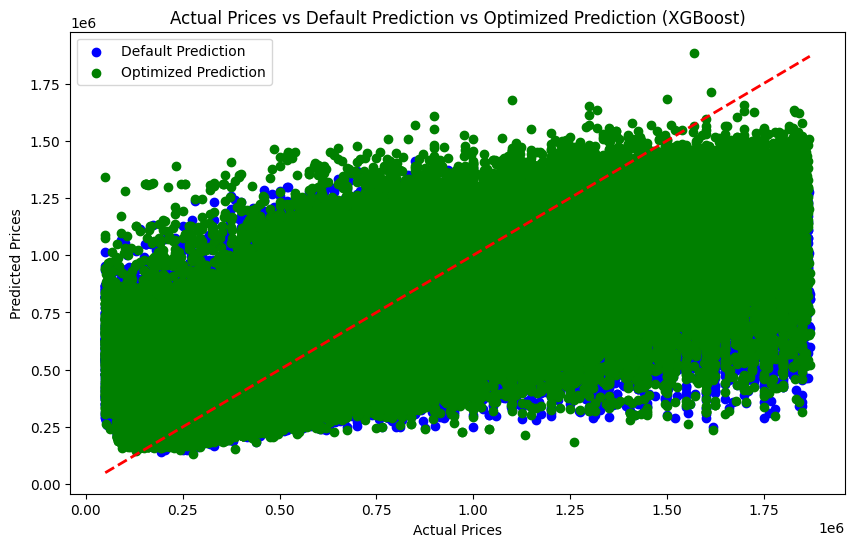

In [ ]:
# Plot actual prices versus default prediction versus optimized prediction
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_default, color='blue', label='Default Prediction')
plt.scatter(y_test, y_pred_optimized, color='green', label='Optimized Prediction')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual Prices vs Default Prediction vs Optimized Prediction (XGBoost)')
plt.legend()
plt.show()

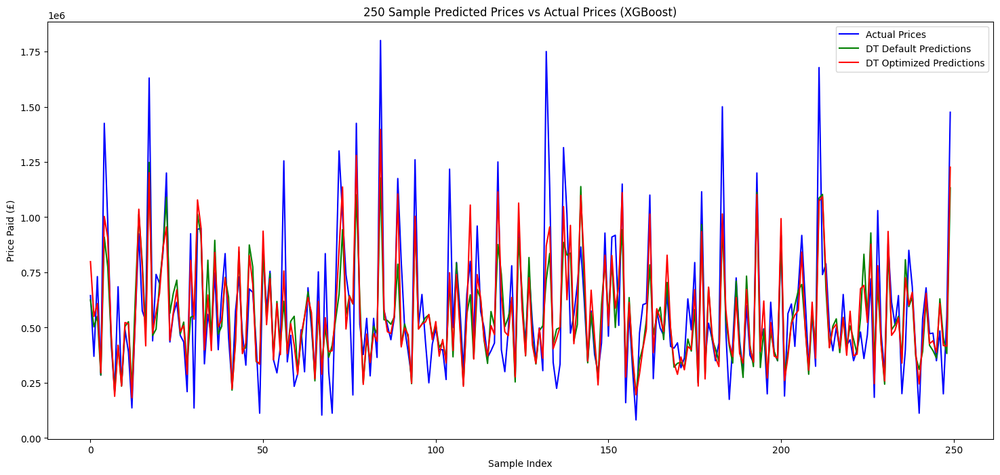

In [ ]:
# Randomly select 250 samples from the test set
np.random.seed(42)
sample_indices = np.random.choice(len(y_test), size=250, replace=False)
sample_y_test = y_test.iloc[sample_indices]
sample_y_pred_default = y_pred_default[sample_indices]
sample_y_pred_optimized = y_pred_optimized[sample_indices]

# Plot the sample of predicted prices versus actual prices
plt.figure(figsize=(18, 8))
plt.plot(range(len(sample_y_test)), sample_y_test, label='Actual Prices', color='blue')
plt.plot(range(len(sample_y_test)), sample_y_pred_default, label='DT Default Predictions', color='green')
plt.plot(range(len(sample_y_test)), sample_y_pred_optimized, label='DT Optimized Predictions', color='red')
plt.xlabel('Sample Index')
plt.ylabel('Price Paid (£)')
plt.title('250 Sample Predicted Prices vs Actual Prices (XGBoost)')
plt.legend()
plt.show()

# **XAI - XGBoost**

In [ ]:

pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 11.5 MB/s eta 0:00:00


In [ ]:
import shap

# Initialize the SHAP explainer with the best model and training data
explainer = shap.Explainer(best_xgb_model, X_train)
# Calculate SHAP values for the test data
shap_values = explainer.shap_values(X_test)


100%|===================| 321006/321038 [95:28<00:00]       

In [ ]:
explainer.expected_value, np.mean(y_test)

(479227.4395620722, 575509.8797307484)

## **Global interpretability**

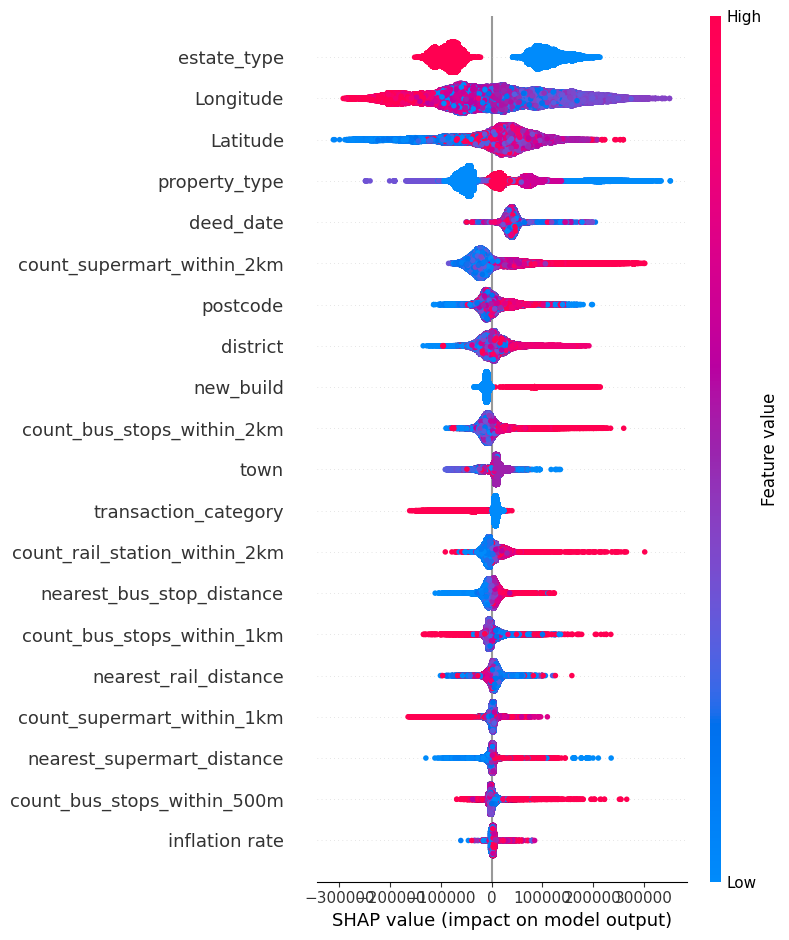

In [ ]:
# Visualize SHAP summary plot
shap.summary_plot(shap_values, X_test)

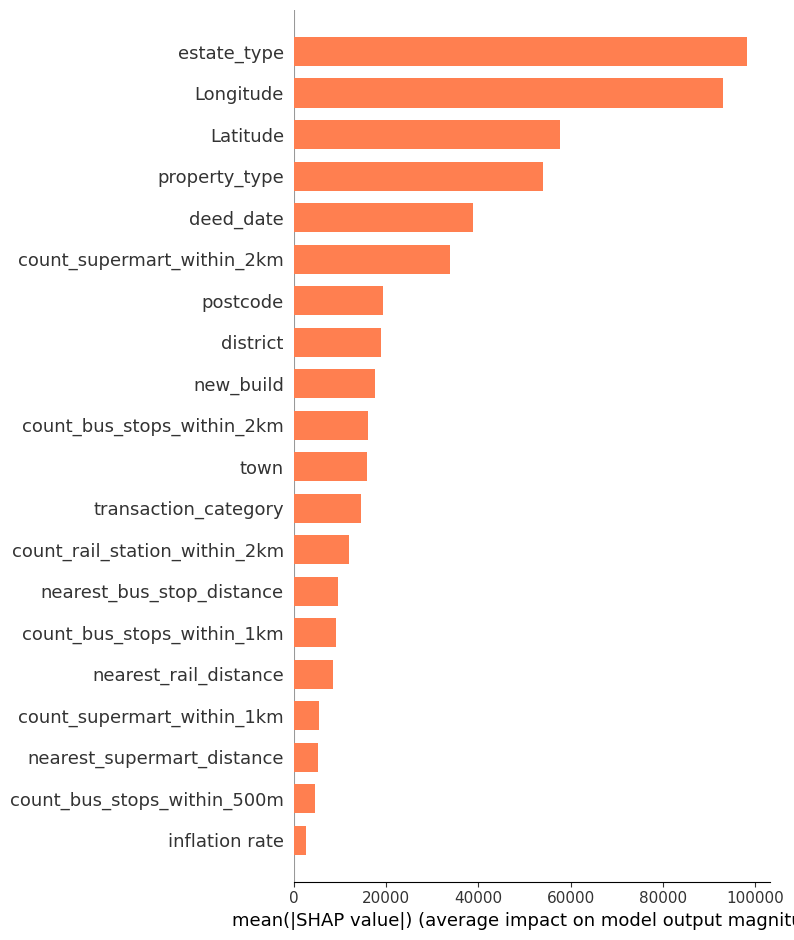

In [ ]:
# Create summary plot with custom colors and increased size
plt.figure(figsize=(12, 8))  # Set the size of the plot
shap.summary_plot(shap_values, X_test, plot_type='bar', color='coral')
plt.show()

In [ ]:
shap.initjs()
# Check feature impact on individual predictions
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0])

## **Shap analysis - Local**

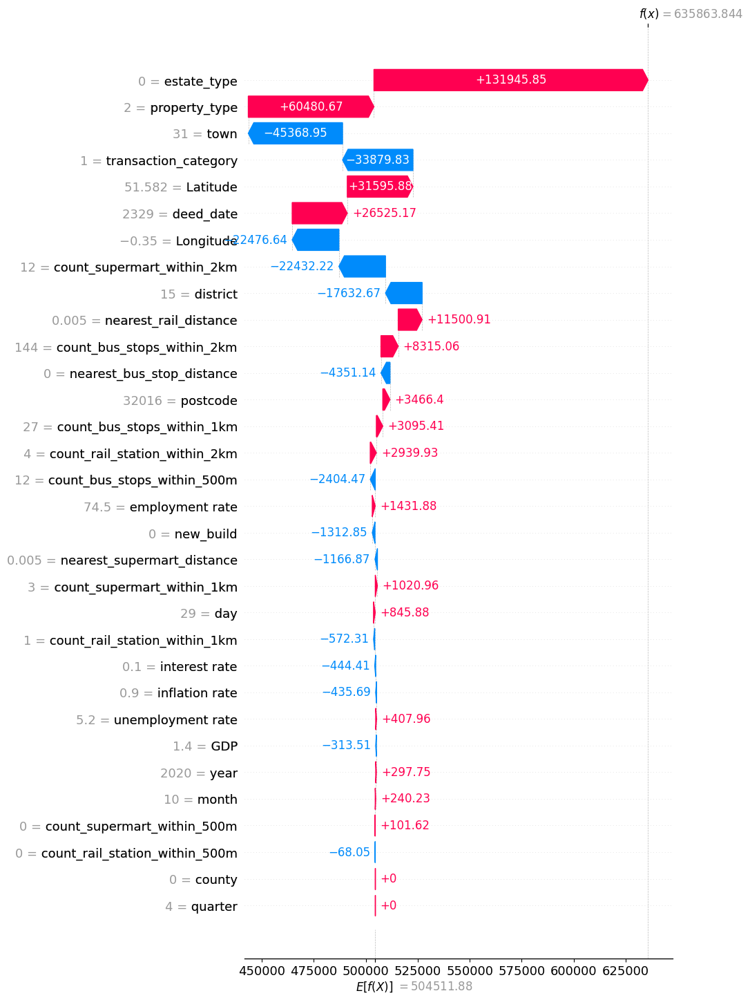

In [ ]:
# Create a SHAP explainer for your model
explainer = shap.TreeExplainer(best_xgb_model)

# Choose the index of the instance you want to explain
index_to_explain = 0

# Create the Explanation object
expl = shap.Explanation(values=shap_values[index_to_explain], base_values=explainer.expected_value, data=X_test.iloc[index_to_explain])

# Create the waterfall plot for the selected instance
shap.plots.waterfall(expl, max_display=99, show=False)

# Save the plot to a file
plt.gcf()
plt.savefig("waterfall_plot.png")
plt.show()

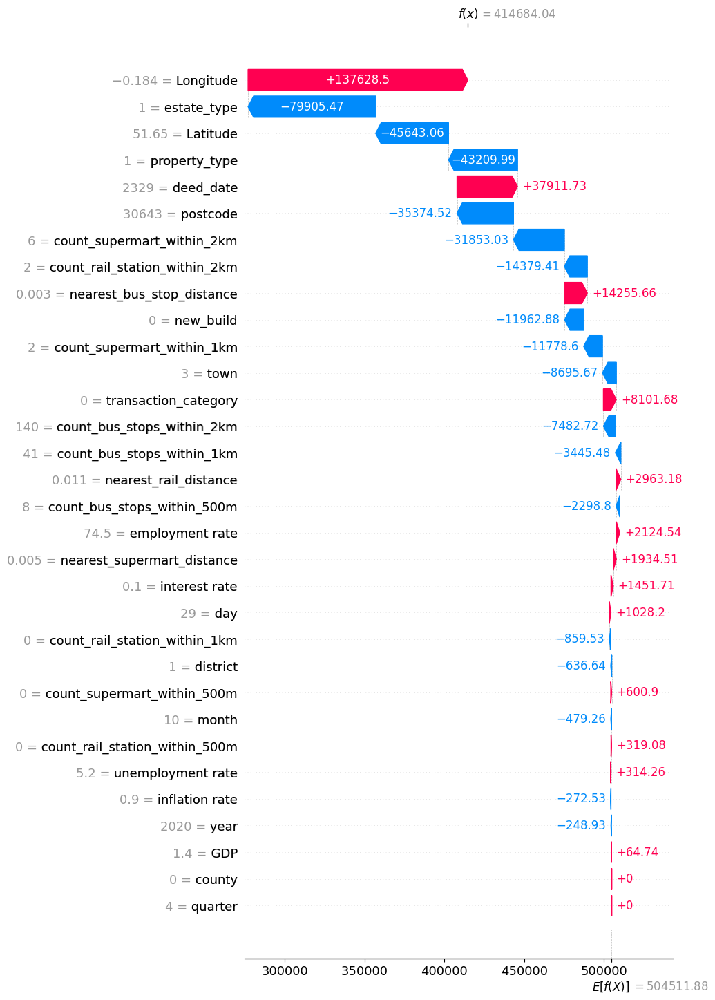

In [ ]:
# Create a SHAP explainer for your model
explainer = shap.TreeExplainer(best_xgb_model)

# Choose the index of the instance you want to explain
index_to_explain = 1

# Create the Explanation object
expl = shap.Explanation(values=shap_values[index_to_explain], base_values=explainer.expected_value, data=X_test.iloc[index_to_explain])

# Create the waterfall plot for the selected instance
shap.plots.waterfall(expl, max_display=99, show=False)

# Save the plot to a file
plt.gcf()
plt.savefig("waterfall_plot.png")
plt.show()

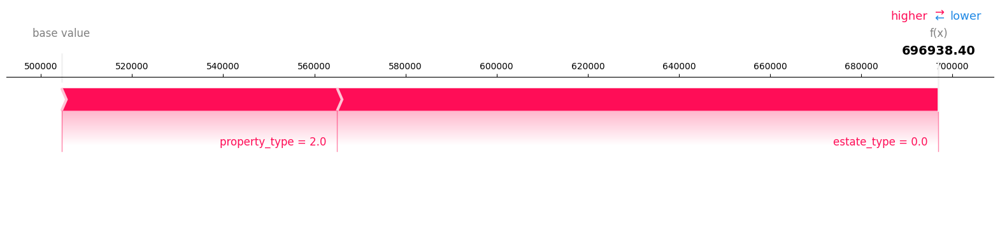

In [ ]:
# Choose a specific data point for explanation (e.g., the first data point)
data_point_index = 0
data_point_shap_values = shap_values[data_point_index]

# Calculate the 95th percentile of the SHAP values
percentile_95 = np.percentile(np.abs(data_point_shap_values), 95)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_95]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_95]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

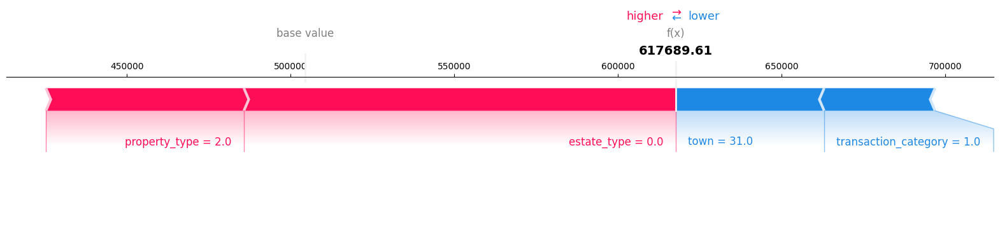

In [ ]:
# Choose a specific data point for explanation (e.g., the first data point)
data_point_index = 0
data_point_shap_values = shap_values[data_point_index]

# Calculate the 90th percentile of the SHAP values
percentile_90 = np.percentile(np.abs(data_point_shap_values), 90)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_90]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_90]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

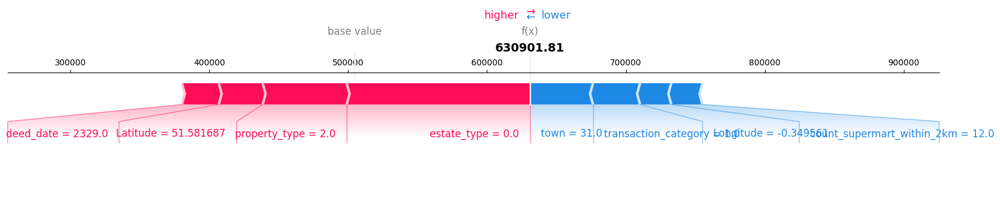

In [ ]:
# Choose a specific data point for explanation (e.g., the first data point)
data_point_index = 0
data_point_shap_values = shap_values[data_point_index]

# Calculate the 75th percentile of the SHAP values
percentile_75 = np.percentile(np.abs(data_point_shap_values), 75)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_75]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_75]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

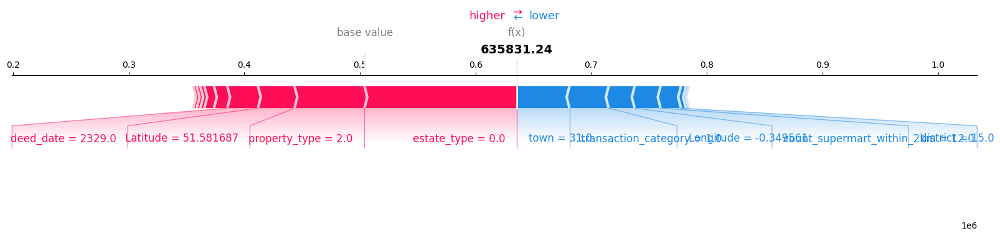

In [ ]:
# Choose a specific data point for explanation (e.g., the first data point)
data_point_index = 0
data_point_shap_values = shap_values[data_point_index]

# Calculate the 50th percentile of the SHAP values
percentile_50 = np.percentile(np.abs(data_point_shap_values), 50)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_50]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_50]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

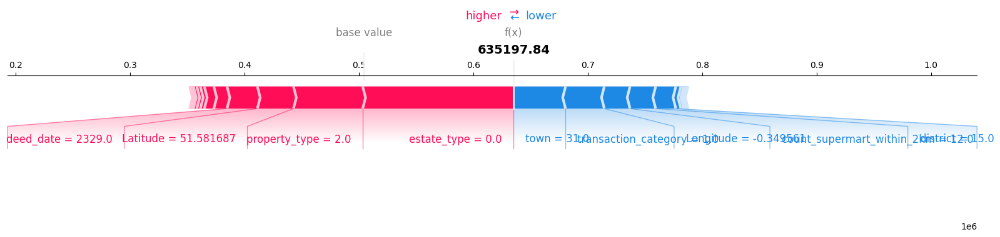

In [ ]:
# Choose a specific data point for explanation
data_point_index = 0
data_point_shap_values = shap_values[data_point_index]

# Calculate the 25th percentile of the SHAP values
percentile_25 = np.percentile(np.abs(data_point_shap_values), 25)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_25]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_25]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

/usr/local/lib/python3.10/dist-packages/shap/plots/_force_matplotlib.py:101: RuntimeWarning: divide by zero encountered in scalar divide
  feature_contribution = np.abs(float(feature[0]) - pre_val) / np.abs(total_effect)


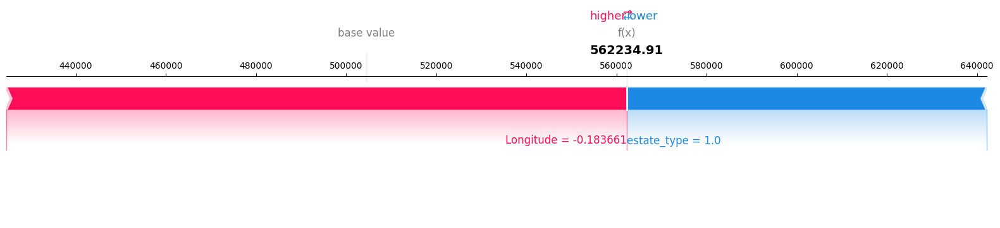

In [ ]:
# Choose a specific data point for explanation
data_point_index = 1
data_point_shap_values = shap_values[data_point_index]

# Calculate the 95th percentile of the SHAP values
percentile_95 = np.percentile(np.abs(data_point_shap_values), 95)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_95]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_95]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

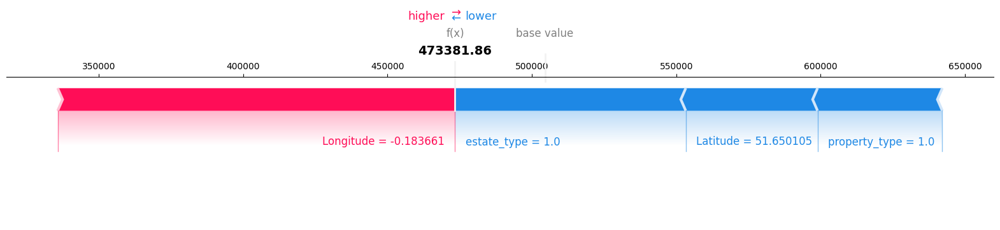

In [ ]:
# Choose a specific data point for explanation
data_point_index = 1
data_point_shap_values = shap_values[data_point_index]

# Calculate the 90th percentile of the SHAP values
percentile_90 = np.percentile(np.abs(data_point_shap_values), 90)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_90]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_90]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

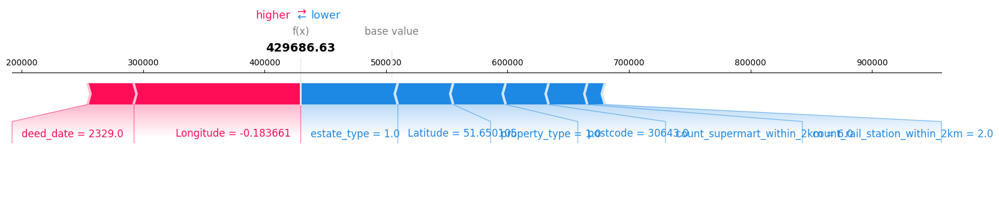

In [ ]:
# Choose a specific data point for explanation
data_point_index = 1
data_point_shap_values = shap_values[data_point_index]

# Calculate the 75th percentile of the SHAP values
percentile_75 = np.percentile(np.abs(data_point_shap_values), 75)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_75]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_75]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

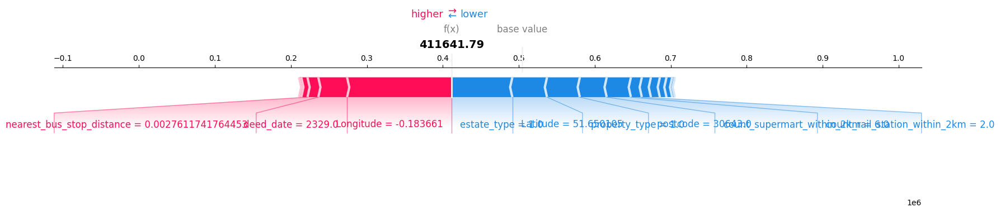

In [ ]:
# Choose a specific data point for explanation
data_point_index = 1
data_point_shap_values = shap_values[data_point_index]

# Calculate the 50th percentile of the SHAP values
percentile_50 = np.percentile(np.abs(data_point_shap_values), 50)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_50]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_50]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

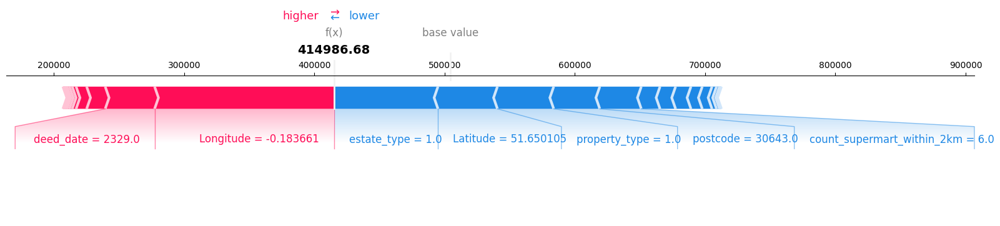

In [ ]:
# Choose a specific data point for explanation
data_point_index = 1
data_point_shap_values = shap_values[data_point_index]

# Calculate the 25th percentile of the SHAP values
percentile_25 = np.percentile(np.abs(data_point_shap_values), 25)

# Filter features based on percentile range
selected_features = X_test.columns[np.abs(data_point_shap_values) >= percentile_25]
selected_shap_values = data_point_shap_values[np.abs(data_point_shap_values) >= percentile_25]

# Generate explanation for the chosen data point with selected features
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, selected_shap_values, X_test.iloc[data_point_index][selected_features], matplotlib=True)

## **Feature Importance**

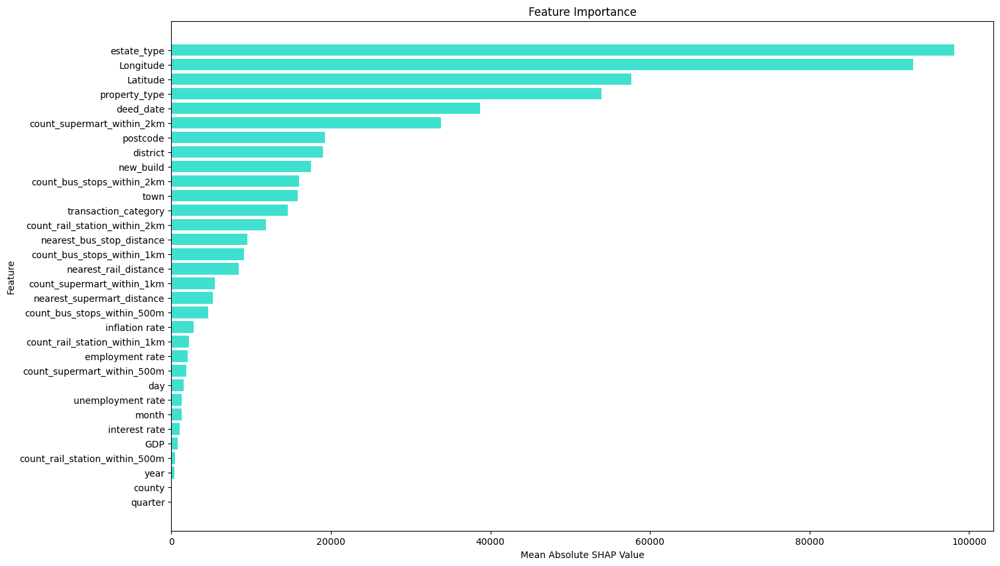

In [ ]:
# Aggregate SHAP values
mean_abs_shap = np.mean(np.abs(shap_values), axis=0)
feature_names = X_train.columns

# Create a DataFrame to store feature importance
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Mean_abs_SHAP': mean_abs_shap})
feature_importance_df = feature_importance_df.sort_values(by='Mean_abs_SHAP', ascending=True)

# Visualize feature importance
plt.figure(figsize=(16, 10))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Mean_abs_SHAP'], color='turquoise')
plt.xlabel('Mean Absolute SHAP Value')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

## **Individual Prediction Explanations**

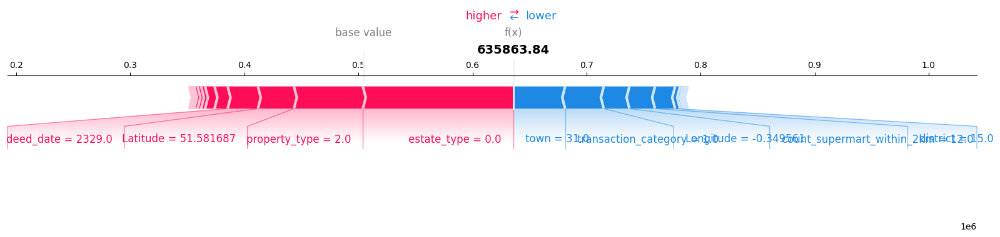

In [ ]:
# Choose a specific data point for explanation (e.g., the first data point)
data_point_index = 0
data_point_shap_values = shap_values[data_point_index]

# Generate explanation for the chosen data point
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, data_point_shap_values, X_test.iloc[data_point_index], matplotlib=True)

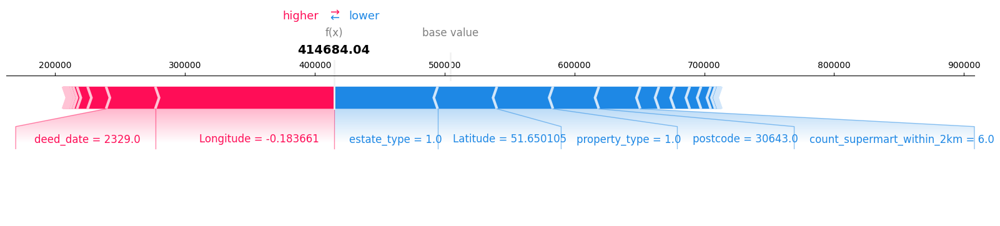

In [ ]:
# Choose a specific data point for explanation (e.g., the first data point)
data_point_index = 1
data_point_shap_values = shap_values[data_point_index]

# Generate explanation for the chosen data point
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, data_point_shap_values, X_test.iloc[data_point_index], matplotlib=True)

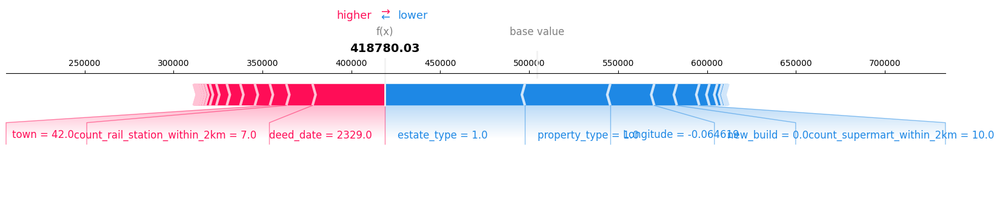

In [ ]:
# Choose a specific data point for explanation
data_point_index = 2
data_point_shap_values = shap_values[data_point_index]

# Generate explanation for the chosen data point
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, data_point_shap_values, X_test.iloc[data_point_index], matplotlib=True)

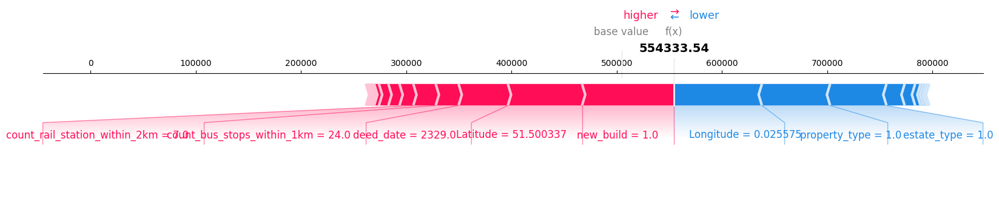

In [ ]:
# Choose a specific data point for explanation
data_point_index = 3
data_point_shap_values = shap_values[data_point_index]

# Generate explanation for the chosen data point
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, data_point_shap_values, X_test.iloc[data_point_index], matplotlib=True)

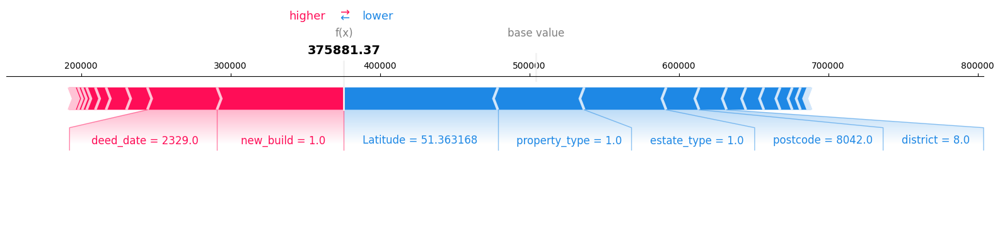

In [ ]:
# Choose a specific data point for explanation
data_point_index = 4
data_point_shap_values = shap_values[data_point_index]

# Generate explanation for the chosen data point
shap.initjs()  # Initialize Javascript for visualization (required for some plots)
shap.force_plot(explainer.expected_value, data_point_shap_values, X_test.iloc[data_point_index], matplotlib=True)

## **Dependence Plots**

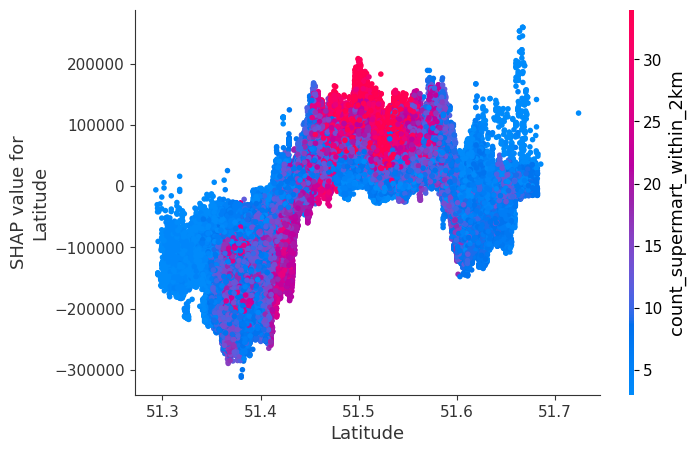

In [ ]:
# Choose a feature for the dependence plot (e.g., 'Latitude')
feature_index = 'Latitude'

# Generate dependence plot
shap.dependence_plot(feature_index, shap_values, X_test)

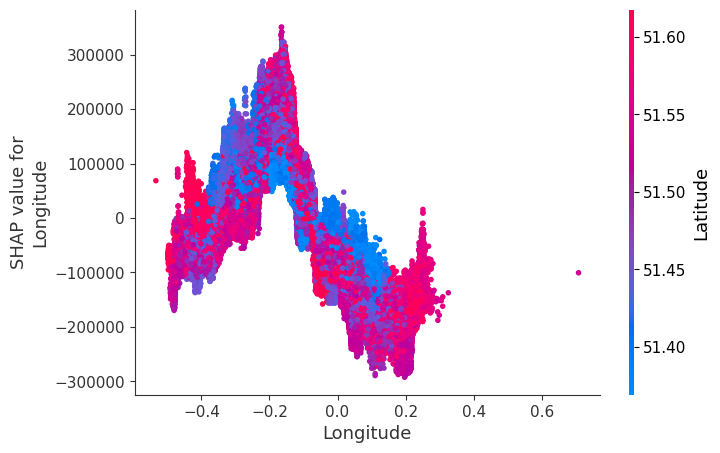

In [ ]:
# Choose a feature for the dependence plot (e.g., 'Longitude')
feature_index = 'Longitude'

# Generate dependence plot
shap.dependence_plot(feature_index, shap_values, X_test)

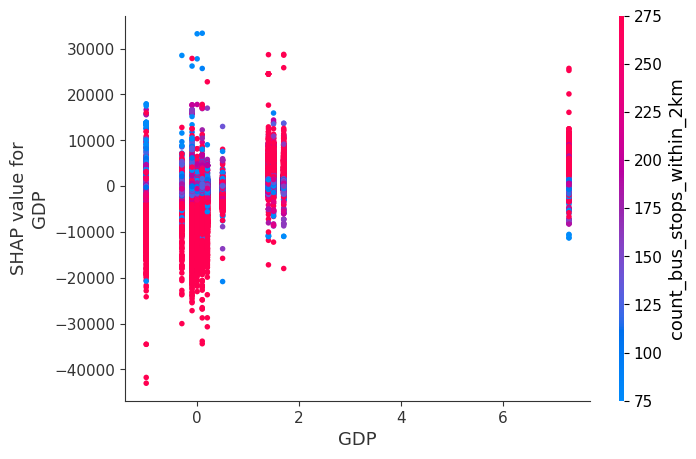

In [ ]:
shap.dependence_plot('GDP', shap_values, X_test)

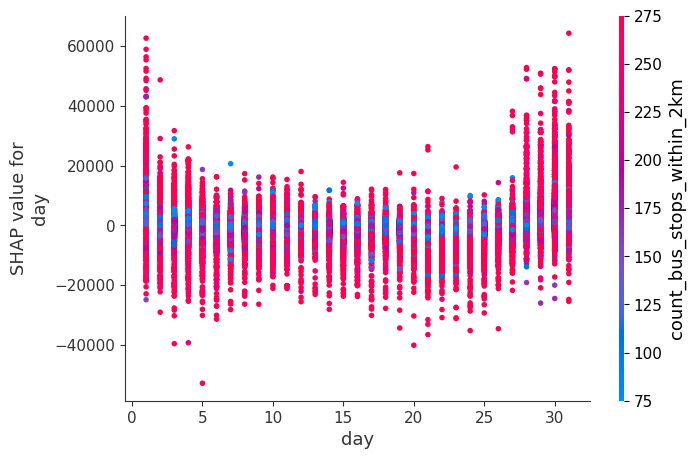

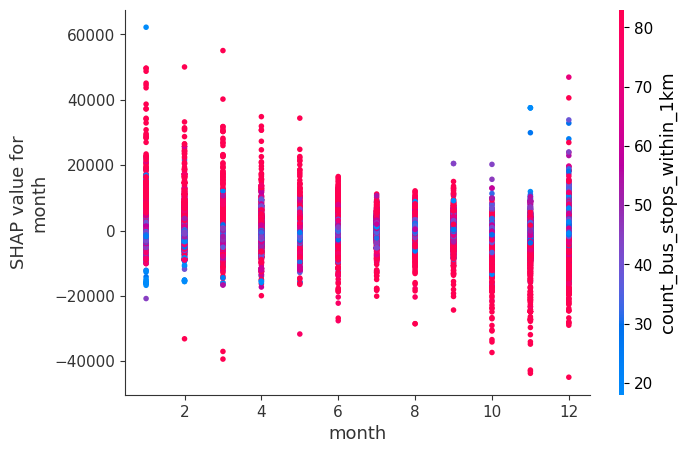

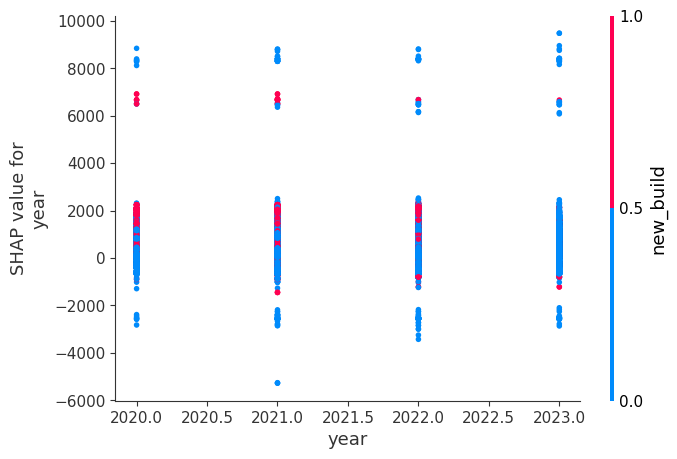

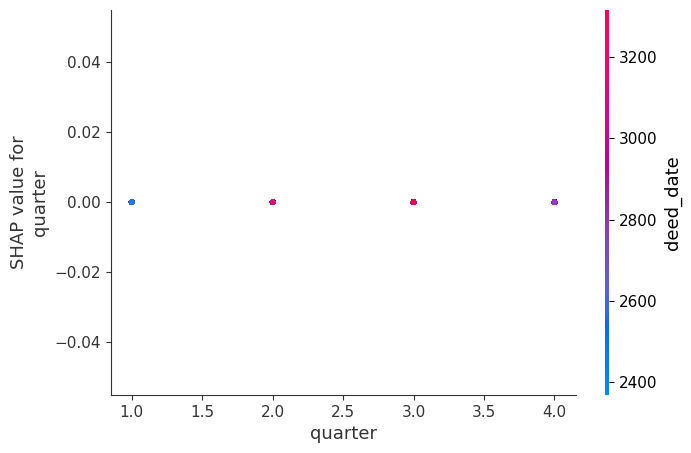

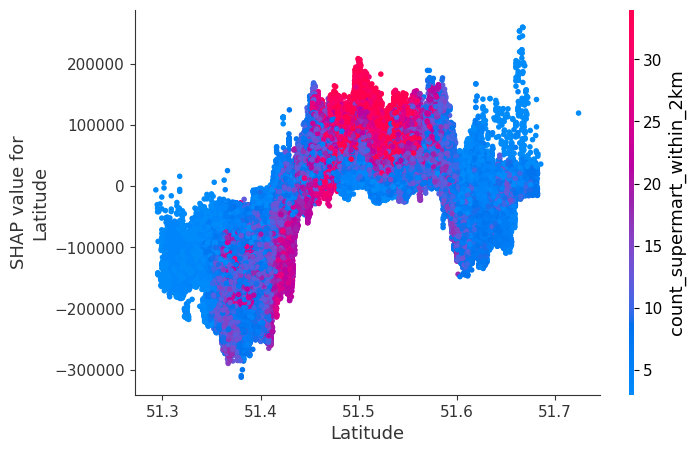

...

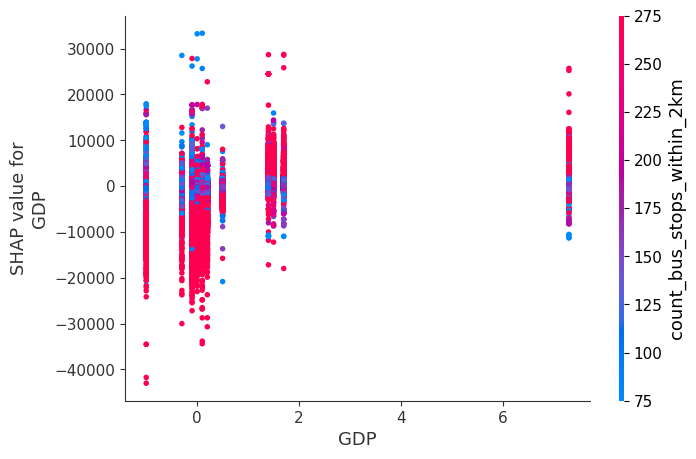

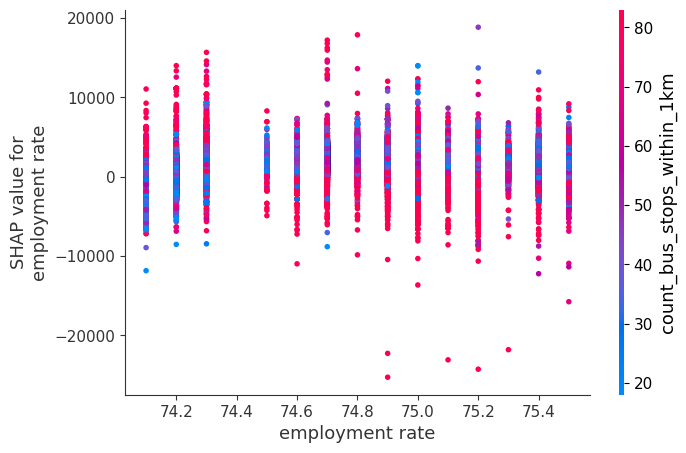

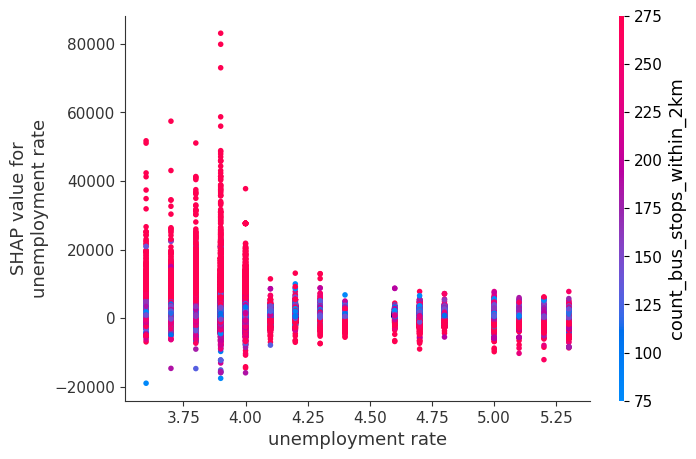

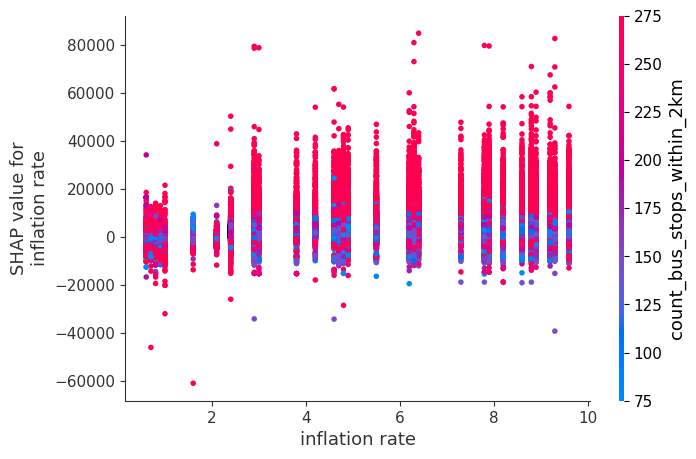

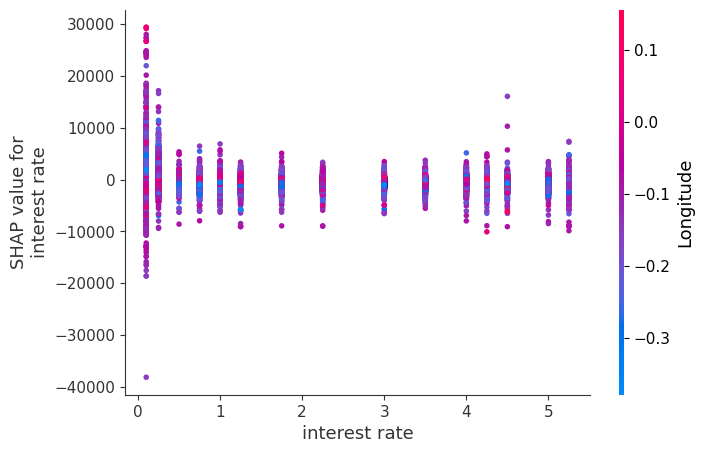

In [ ]:
# Define a list of features to analyze
features_to_plot = ['day', 'month', 'year', 'quarter', 'Latitude', 'Longitude', 'deed_date', 'property_type', 'new_build', 'estate_type', 'transaction_category',
            'nearest_bus_stop_distance', 'count_bus_stops_within_500m', 'count_bus_stops_within_1km', 'count_bus_stops_within_2km', 'town', 'district', 'county',
            'nearest_rail_distance', 'count_rail_station_within_500m', 'count_rail_station_within_1km', 'count_rail_station_within_2km', 'postcode',
            'nearest_supermart_distance', 'count_supermart_within_500m', 'count_supermart_within_1km', 'count_supermart_within_2km',
            'GDP', 'employment rate', 'unemployment rate', 'inflation rate', 'interest rate']

# Create dependence plots for each feature
for feature_index in features_to_plot:
    shap.dependence_plot(feature_index, shap_values, X_test)

# **One hot encoding**

In [ ]:
df_tier5 = pd.read_csv('drive/MyDrive/Dissertation/df_tier4_Visuals_10yrs.csv')

In [ ]:
df_tier5.dtypes

Unnamed: 0                          int64
unique_id                          object
deed_date                          object
day                                 int64
month                               int64
year                                int64
quarter                             int64
property_type                      object
new_build                          object
estate_type                        object
transaction_category               object
town                               object
district                           object
county                             object
postcode                           object
Latitude                          float64
Longitude                         float64
price_paid                          int64
nearest_bus_stop_distance         float64
count_bus_stops_within_500m         int64
count_bus_stops_within_1km          int64
count_bus_stops_within_2km          int64
nearest_rail_distance             float64
count_rail_station_within_500m    

In [ ]:
# Drop the "Unnamed: 0" and "unique_id" columns
df_tier5.drop(["Unnamed: 0", "unique_id"], axis=1, inplace=True)

In [ ]:
# Perform one-hot encoding for categorical variables
df_tier5 = pd.get_dummies(df_tier5, columns=['deed_date', 'property_type', 'new_build', 'estate_type', 'transaction_category', 'town',
                                             'district', 'county', 'postcode'])

In [ ]:
df_tier5['district'].unique()

array(['BARNET', 'HACKNEY', 'HAMMERSMITH AND FULHAM',
       'RICHMOND UPON THAMES', 'WALTHAM FOREST', 'BRENT', 'GREENWICH',
       'BARKING AND DAGENHAM', 'KINGSTON UPON THAMES', 'LAMBETH',
       'SUTTON', 'HOUNSLOW', 'NEWHAM', 'WANDSWORTH',
       'CITY OF WESTMINSTER', 'SOUTHWARK', 'CROYDON', 'TOWER HAMLETS',
       'KENSINGTON AND CHELSEA', 'LEWISHAM', 'CAMDEN', 'HILLINGDON',
       'HAVERING', 'BROMLEY', 'HARROW', 'REDBRIDGE', 'BEXLEY', 'MERTON',
       'ISLINGTON', 'HARINGEY', 'ENFIELD', 'EALING', 'CITY OF LONDON'],
      dtype=object)

# **RandomForest Regressor**

# **Default**

In [ ]:
# Initialize and train the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Model evaluation
y_pred_default = rf_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred_default)
mse = mean_squared_error(y_test, y_pred_default)
rmse = mean_squared_error(y_test, y_pred_default, squared=False)
r2 = r2_score(y_test, y_pred_default)

print("R-squared:", r2)
print("Root Mean Squared Error:", rmse)
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

R-squared: 0.6559525667616317
Root Mean Squared Error: 184666.37137409276
Mean Squared Error: 34101668716.474342
Mean Absolute Error: 120770.29165137386


## **Features Importance**

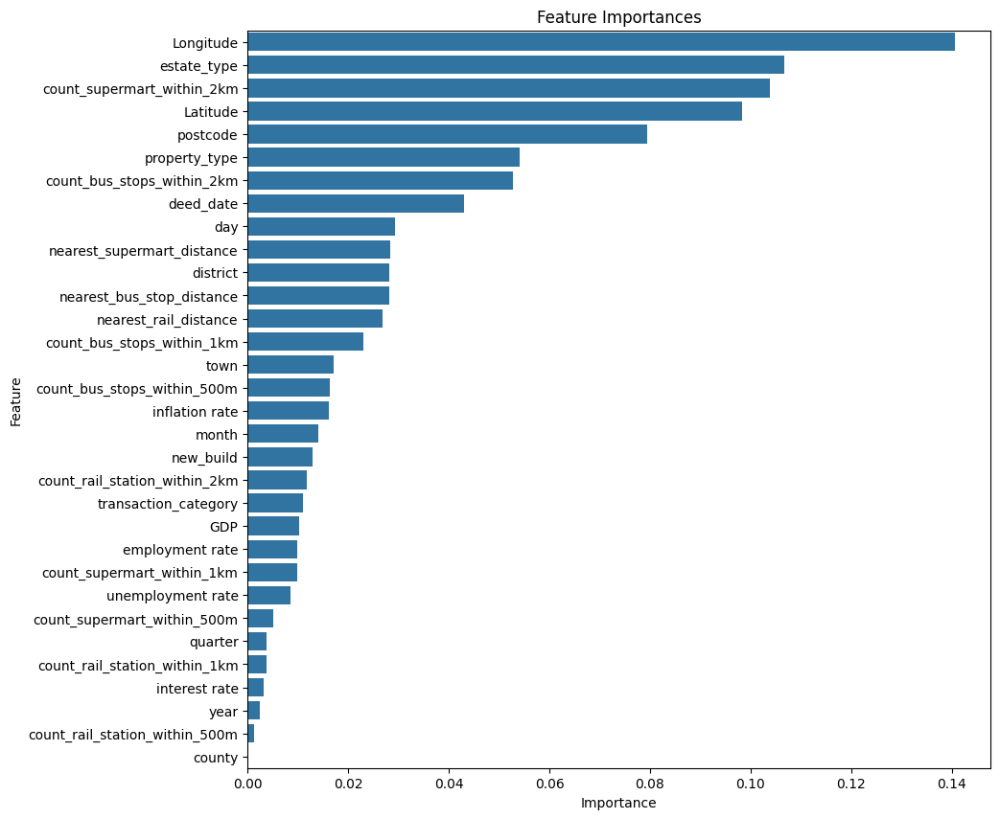

In [ ]:
# Obtain feature importances
feature_importances = rf_model.feature_importances_

# Create a DataFrame to store feature importances along with their names
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importances
plt.figure(figsize=(10, 10))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## **Cross validation**

In [ ]:
# Define custom scoring functions for R-squared, RMSE, MSE, and MAE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Make scorer objects for each custom scoring function
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(rmse, greater_is_better=False)  # RMSE is better when lower
mse_scorer = make_scorer(mse, greater_is_better=False)    # MSE is better when lower
mae_scorer = make_scorer(mae, greater_is_better=False)    # MAE is better when lower

# Perform cross-validation with custom scoring functions
cv_r2 = cross_val_score(rf_model, X_train, y_train, cv=5, scoring=r2_scorer)
cv_rmse = -cross_val_score(rf_model, X_train, y_train, cv=5, scoring=rmse_scorer)
cv_mse = -cross_val_score(rf_model, X_train, y_train, cv=5, scoring=mse_scorer)
cv_mae = -cross_val_score(rf_model, X_train, y_train, cv=5, scoring=mae_scorer)

# Print the cross-validation scores
print("Cross-Validation R-squared:", cv_r2)
print("Mean R-squared:", np.mean(cv_r2))
print("Cross-Validation RMSE:", cv_rmse)
print("Mean RMSE:", np.mean(cv_rmse))
print("Cross-Validation MSE:", cv_mse)
print("Mean MSE:", np.mean(cv_mse))
print("Cross-Validation MAE:", cv_mae)
print("Mean MAE:", np.mean(cv_mae))

# **Optimization**

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Define the Random Forest Regressor model
rf = RandomForestRegressor()

# Define the hyperparameter grid
param_dist = {
    'n_estimators': randint(50, 200),  # Number of trees in the forest
    'max_features': ['auto', 'sqrt'],  # Number of features to consider at every split
    'max_depth': randint(10, 100),  # Maximum depth of the tree
    'min_samples_split': randint(2, 10),  # Minimum number of samples required to split a node
    'min_samples_leaf': randint(1, 10),  # Minimum number of samples required at each leaf node
    'bootstrap': [True, False]  # Method of selecting samples for training each tree
}

# Define the RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=100, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Perform the Randomized Search
random_search.fit(X_train, y_train)

# Get the best parameters
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_model = random_search.best_estimator_


Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.

The exit codes of the workers are {SIGKILL(-9)}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import randint

# Define hyperparameter grid with reduced parameters
param_dist = {
    'n_estimators': randint(50, 200),  # Reduced range for number of trees
    'max_depth': randint(5, 20),        # Reduced range for maximum depth
    'min_samples_split': randint(2, 10),# Reduced range for minimum samples split
    'min_samples_leaf': randint(1, 5)   # Reduced range for minimum samples leaf
}

# Instantiate RandomForestRegressor
rf = RandomForestRegressor()

# Instantiate RandomizedSearchCV with reduced parameters
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist,
                                   n_iter=10, cv=5, scoring='neg_mean_squared_error',
                                   random_state=42, n_jobs=-1)

# Fit RandomizedSearchCV to your data
random_search.fit(X_train, y_train)

# Get best parameters and best estimator
best_params = random_search.best_params_
best_estimator = random_search.best_estimator_

# Best parameters
print("Best Parameters:", best_params)
print("Best Estimeters:", best_estimator)

# Use the best estimator for further analysis or prediction

KeyboardInterrupt: 

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import xgboost as xgb

# Initialize a new RandomForestRegressor with the best hyperparameters
best_rf_model = RandomForestRegressor(
    max_depth=17,
    min_samples_leaf=4,
    min_samples_split=2,
    n_estimators=98
)

# Train the model on your training data
best_rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_optimized = best_rf_model.predict(X_test)

# Evaluate the model performance
r2 = r2_score(y_test, y_pred_optimized)
mse = mean_squared_error(y_test, y_pred_optimized)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_optimized)

# Print the evaluation metrics
print("Test R-squared:", r2)
print("Test RMSE:", rmse)
print("Test MSE:", mse)
print("Test MAE:", mae)


Test R-squared: 0.6229231819549628
Test RMSE: 193327.4716707604
Test MSE: 37375511302.608665
Test MAE: 127629.42948656919


In [ ]:
# Model evaluation
y_pred_optimized = best_rf_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred_optimized)
mse = mean_squared_error(y_test, y_pred_optimized)
rmse = mean_squared_error(y_test, y_pred_optimized, squared=False)
r2 = r2_score(y_test, y_pred_optimized)

print("R-squared:", r2)
print("Root Mean Squared Error:", rmse)
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

NotFittedError: This RandomForestRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

## **Features importance**

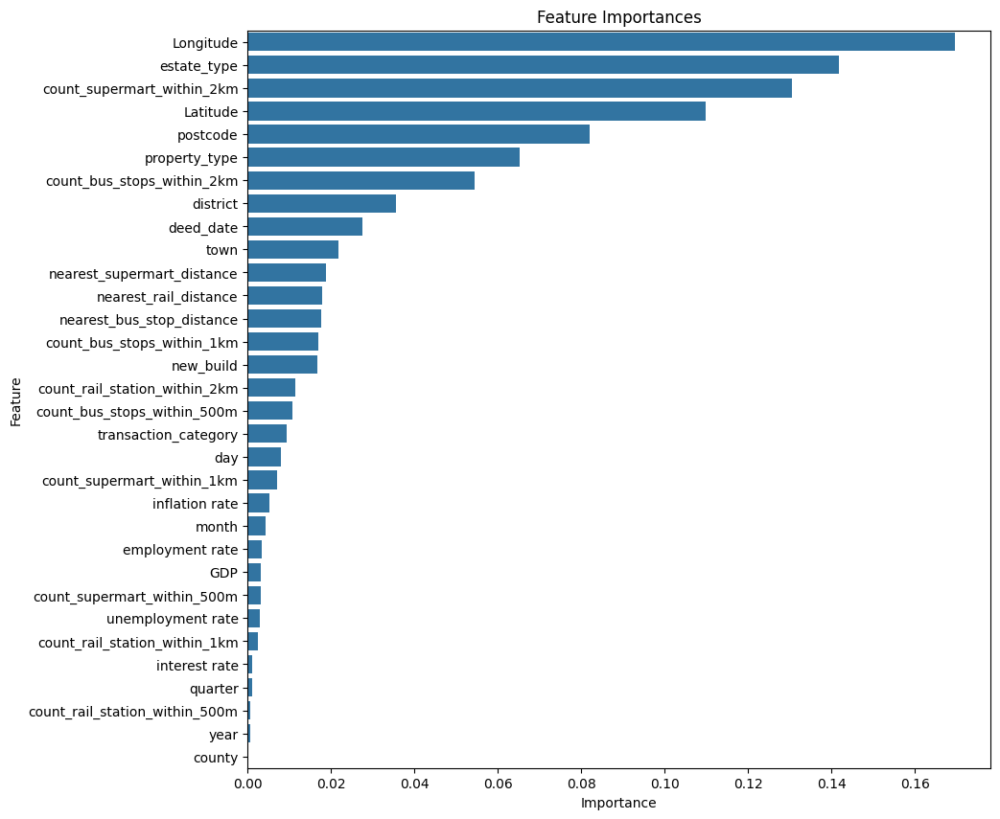

In [ ]:
# Obtain feature importances
feature_importances = best_rf_model.feature_importances_

# Create a DataFrame to store feature importances along with their names
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importances
plt.figure(figsize=(10, 10))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## **Cross validation**

In [ ]:
# Define custom scoring functions for R-squared, RMSE, MSE, and MAE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Make scorer objects for each custom scoring function
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(rmse, greater_is_better=False)  # RMSE is better when lower
mse_scorer = make_scorer(mse, greater_is_better=False)    # MSE is better when lower
mae_scorer = make_scorer(mae, greater_is_better=False)    # MAE is better when lower

# Perform cross-validation with custom scoring functions
cv_r2 = cross_val_score(best_rf_model, X_train, y_train, cv=5, scoring=r2_scorer)
cv_rmse = -cross_val_score(best_rf_model, X_train, y_train, cv=5, scoring=rmse_scorer)
cv_mse = -cross_val_score(best_rf_model, X_train, y_train, cv=5, scoring=mse_scorer)
cv_mae = -cross_val_score(best_rf_model, X_train, y_train, cv=5, scoring=mae_scorer)

# Print the cross-validation scores
print("Cross-Validation R-squared:", cv_r2)
print("Mean R-squared:", np.mean(cv_r2))
print("Cross-Validation RMSE:", cv_rmse)
print("Mean RMSE:", np.mean(cv_rmse))
print("Cross-Validation MSE:", cv_mse)
print("Mean MSE:", np.mean(cv_mse))
print("Cross-Validation MAE:", cv_mae)
print("Mean MAE:", np.mean(cv_mae))

# **Visualization**

<ipython-input-14-90c3b5125ce7>:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red')


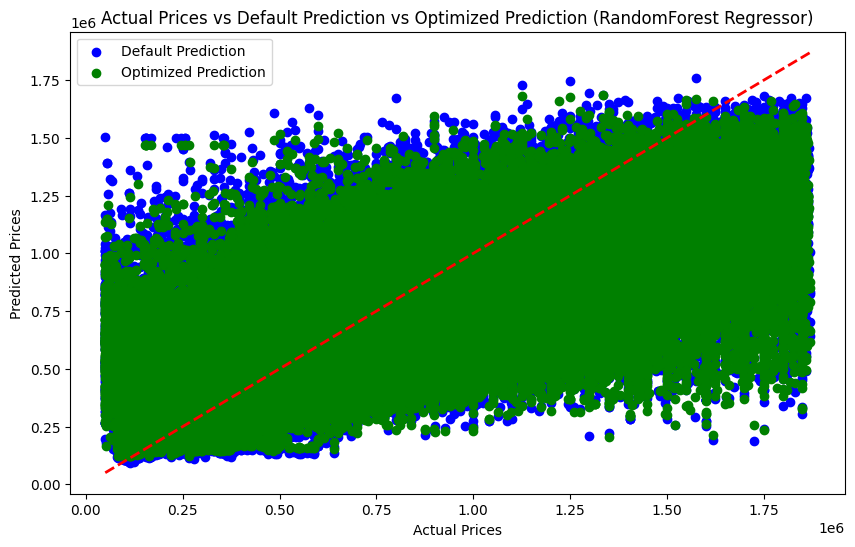

In [ ]:
# Plot actual prices versus default prediction versus optimized prediction
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_default, color='blue', label='Default Prediction')
plt.scatter(y_test, y_pred_optimized, color='green', label='Optimized Prediction')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual Prices vs Default Prediction vs Optimized Prediction (RandomForest Regressor)')
plt.legend()
plt.show()

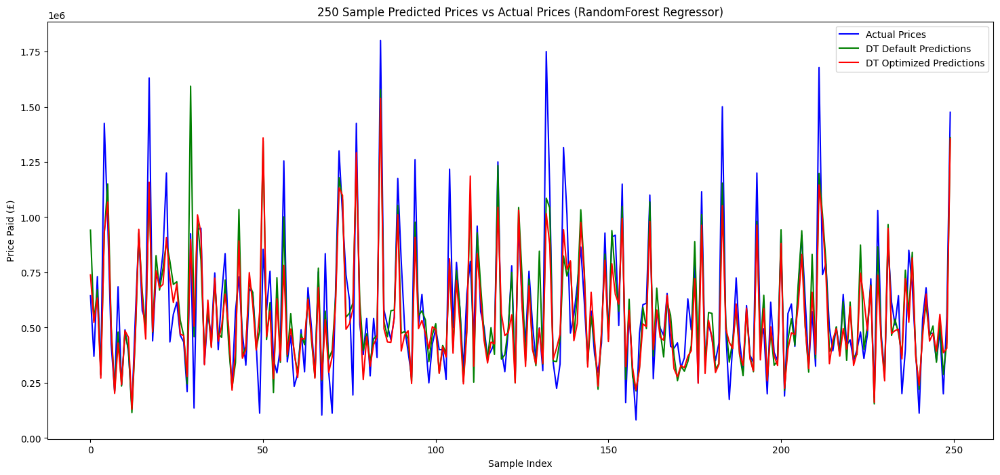

In [ ]:
# Randomly select 250 samples from the test set
np.random.seed(42)
sample_indices = np.random.choice(len(y_test), size=250, replace=False)
sample_y_test = y_test.iloc[sample_indices]
sample_y_pred_default = y_pred_default[sample_indices]
sample_y_pred_optimized = y_pred_optimized[sample_indices]

# Plot the sample of predicted prices versus actual prices
plt.figure(figsize=(18, 8))
plt.plot(range(len(sample_y_test)), sample_y_test, label='Actual Prices', color='blue')
plt.plot(range(len(sample_y_test)), sample_y_pred_default, label='DT Default Predictions', color='green')
plt.plot(range(len(sample_y_test)), sample_y_pred_optimized, label='DT Optimized Predictions', color='red')
plt.xlabel('Sample Index')
plt.ylabel('Price Paid (£)')
plt.title('250 Sample Predicted Prices vs Actual Prices (RandomForest Regressor)')
plt.legend()
plt.show()

# **Decision Tree Regressor**

# **Default**

In [ ]:
# Initialize and train the Decision Tree Regressor model
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [ ]:
# Model evaluation
y_pred_default = dt_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred_default)
mse = mean_squared_error(y_test, y_pred_default)
rmse = mean_squared_error(y_test, y_pred_default, squared=False)
r2 = r2_score(y_test, y_pred_default)

print("R-squared:", r2)
print("Root Mean Squared Error:", rmse)
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

R-squared: 0.2729579507244674
Root Mean Squared Error: 268446.9161204872
Mean Squared Error: 72063746774.59988
Mean Absolute Error: 172317.83623834504


## **Feature importance**

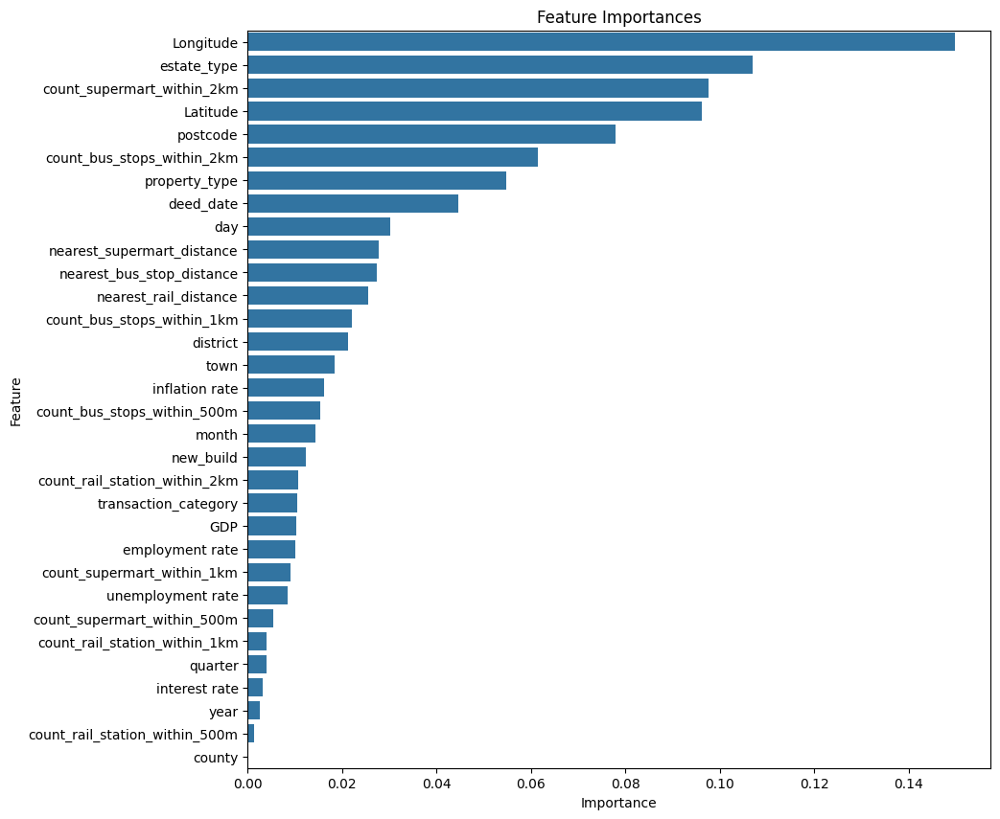

In [ ]:
# Obtain feature importances
feature_importances = dt_model.feature_importances_

# Create a DataFrame to store feature importances along with their names
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importances
plt.figure(figsize=(10, 10))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## **Cross validation**

In [ ]:
# Define custom scoring functions for R-squared, RMSE, MSE, and MAE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Make scorer objects for each custom scoring function
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(rmse, greater_is_better=False)  # RMSE is better when lower
mse_scorer = make_scorer(mse, greater_is_better=False)    # MSE is better when lower
mae_scorer = make_scorer(mae, greater_is_better=False)    # MAE is better when lower

# Perform cross-validation with custom scoring functions
cv_r2 = cross_val_score(dt_model, X_train, y_train, cv=5, scoring=r2_scorer)
cv_rmse = -cross_val_score(dt_model, X_train, y_train, cv=5, scoring=rmse_scorer)
cv_mse = -cross_val_score(dt_model, X_train, y_train, cv=5, scoring=mse_scorer)
cv_mae = -cross_val_score(dt_model, X_train, y_train, cv=5, scoring=mae_scorer)

# Print the cross-validation scores
print("Cross-Validation R-squared:", cv_r2)
print("Mean R-squared:", np.mean(cv_r2))
print("Cross-Validation RMSE:", cv_rmse)
print("Mean RMSE:", np.mean(cv_rmse))
print("Cross-Validation MSE:", cv_mse)
print("Mean MSE:", np.mean(cv_mse))
print("Cross-Validation MAE:", cv_mae)
print("Mean MAE:", np.mean(cv_mae))

Cross-Validation R-squared: [0.35433675 0.35897386 0.28725035 0.28519527 0.1981751 ]
Mean R-squared: 0.29678626920405954
Cross-Validation RMSE: [238084.90258338 235770.22754918 252785.05138676 252213.20477097
 273856.60678458]
Mean RMSE: 250541.99861497508
Cross-Validation MSE: [5.66844208e+10 5.55876002e+10 6.39002822e+10 6.36115007e+10
 7.49974411e+10]
Mean MSE: 62956248996.34933
Cross-Validation MAE: [146406.89768099 144803.37793206 153122.34004052 152057.73698369
 170291.67462362]
Mean MAE: 153336.40545217635


# **Optimization**

In [ ]:
# Hyperparameter Tuning
param_grid = {
    "max_depth": [None, 5, 10, 15],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "max_features": ["auto", "sqrt", "log2"]
}

grid_search = GridSearchCV(estimator=dt_model, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(


Best Parameters: {'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2}


In [ ]:
# Best estimator (model)
best_dt_model = grid_search.best_estimator_

# Model evaluation
y_pred_optimized = best_dt_model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred_optimized)
mse = mean_squared_error(y_test, y_pred_optimized)
rmse = mean_squared_error(y_test, y_pred_optimized, squared=False)
r2 = r2_score(y_test, y_pred_optimized)

print("R-squared:", r2)
print("Root Mean Squared Error:", rmse)
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

R-squared: 0.5269438226762064
Root Mean Squared Error: 216538.44488601372
Mean Squared Error: 46888898113.653206
Mean Absolute Error: 142627.81170535018


## **Feature importance**

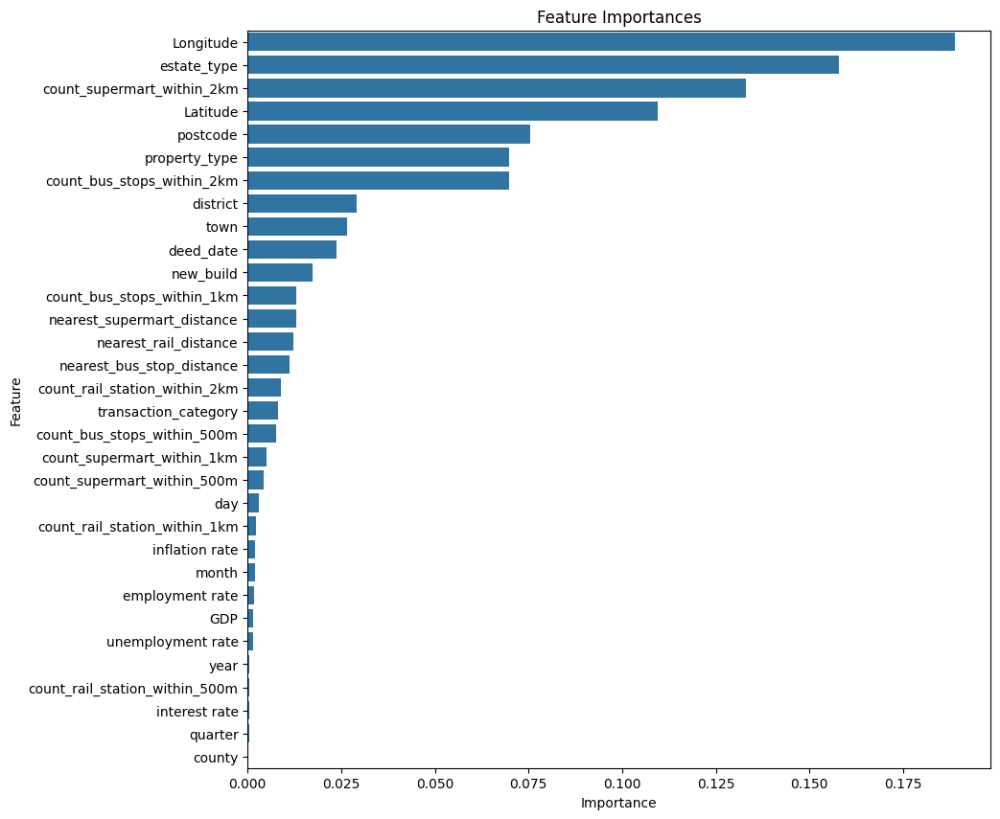

In [ ]:
# Obtain feature importances
feature_importances = best_dt_model.feature_importances_

# Create a DataFrame to store feature importances along with their names
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importances
plt.figure(figsize=(10, 10))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## **Cross validation**

In [ ]:
# Define custom scoring functions for R-squared, RMSE, MSE, and MAE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Make scorer objects for each custom scoring function
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(rmse, greater_is_better=False)  # RMSE is better when lower
mse_scorer = make_scorer(mse, greater_is_better=False)    # MSE is better when lower
mae_scorer = make_scorer(mae, greater_is_better=False)    # MAE is better when lower

# Perform cross-validation with custom scoring functions
cv_r2 = cross_val_score(dt_model, X_train, y_train, cv=5, scoring=r2_scorer)
cv_rmse = -cross_val_score(dt_model, X_train, y_train, cv=5, scoring=rmse_scorer)
cv_mse = -cross_val_score(dt_model, X_train, y_train, cv=5, scoring=mse_scorer)
cv_mae = -cross_val_score(dt_model, X_train, y_train, cv=5, scoring=mae_scorer)

# Print the cross-validation scores
print("Cross-Validation R-squared:", cv_r2)
print("Mean R-squared:", np.mean(cv_r2))
print("Cross-Validation RMSE:", cv_rmse)
print("Mean RMSE:", np.mean(cv_rmse))
print("Cross-Validation MSE:", cv_mse)
print("Mean MSE:", np.mean(cv_mse))
print("Cross-Validation MAE:", cv_mae)
print("Mean MAE:", np.mean(cv_mae))

# **Visualization**

<ipython-input-15-c5600f44c0ac>:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red')
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


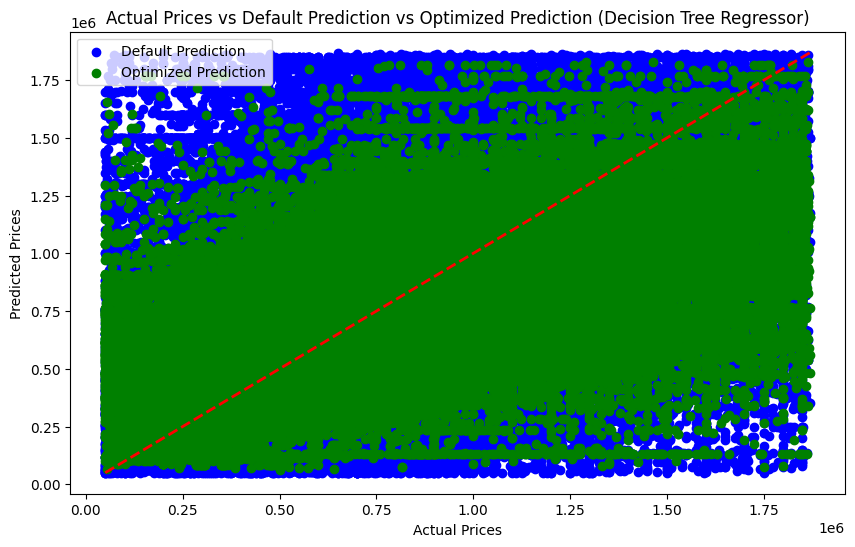

In [ ]:
# Plot actual prices versus default prediction versus optimized prediction
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_default, color='blue', label='Default Prediction')
plt.scatter(y_test, y_pred_optimized, color='green', label='Optimized Prediction')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual Prices vs Default Prediction vs Optimized Prediction (Decision Tree Regressor)')
plt.legend()
plt.show()

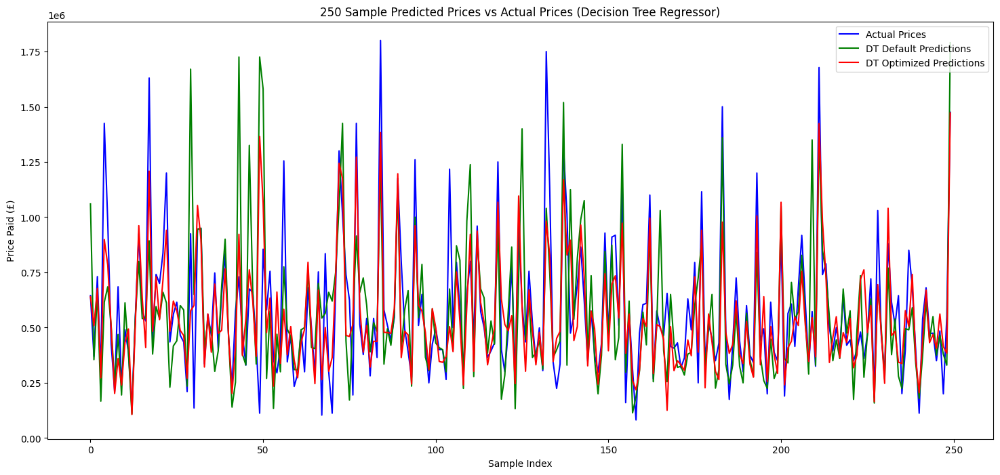

In [ ]:
# Randomly select 250 samples from the test set
np.random.seed(42)
sample_indices = np.random.choice(len(y_test), size=250, replace=False)
sample_y_test = y_test.iloc[sample_indices]
sample_y_pred_default = y_pred_default[sample_indices]
sample_y_pred_optimized = y_pred_optimized[sample_indices]

# Plot the sample of predicted prices versus actual prices
plt.figure(figsize=(18, 8))
plt.plot(range(len(sample_y_test)), sample_y_test, label='Actual Prices', color='blue')
plt.plot(range(len(sample_y_test)), sample_y_pred_default, label='DT Default Predictions', color='green')
plt.plot(range(len(sample_y_test)), sample_y_pred_optimized, label='DT Optimized Predictions', color='red')
plt.xlabel('Sample Index')
plt.ylabel('Price Paid (£)')
plt.title('250 Sample Predicted Prices vs Actual Prices (Decision Tree Regressor)')
plt.legend()
plt.show()

# **Gradient Boosting Regressor**

# **Default**

In [ ]:
# Train the model
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [ ]:
# Make predictions
y_pred = gb_model.predict(X_test)

# Calculate evaluation metrics
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)

print("Evaluation Metrics:")
print("R-squared:", r2)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("Mean Absolute Error:", mae)

Evaluation Metrics:
R-squared: 0.45516389927373646
Mean Squared Error: 54003658846.86001
Root Mean Squared Error: 232386.87322407006
Mean Absolute Error: 153993.741826787


## **Feature importance**

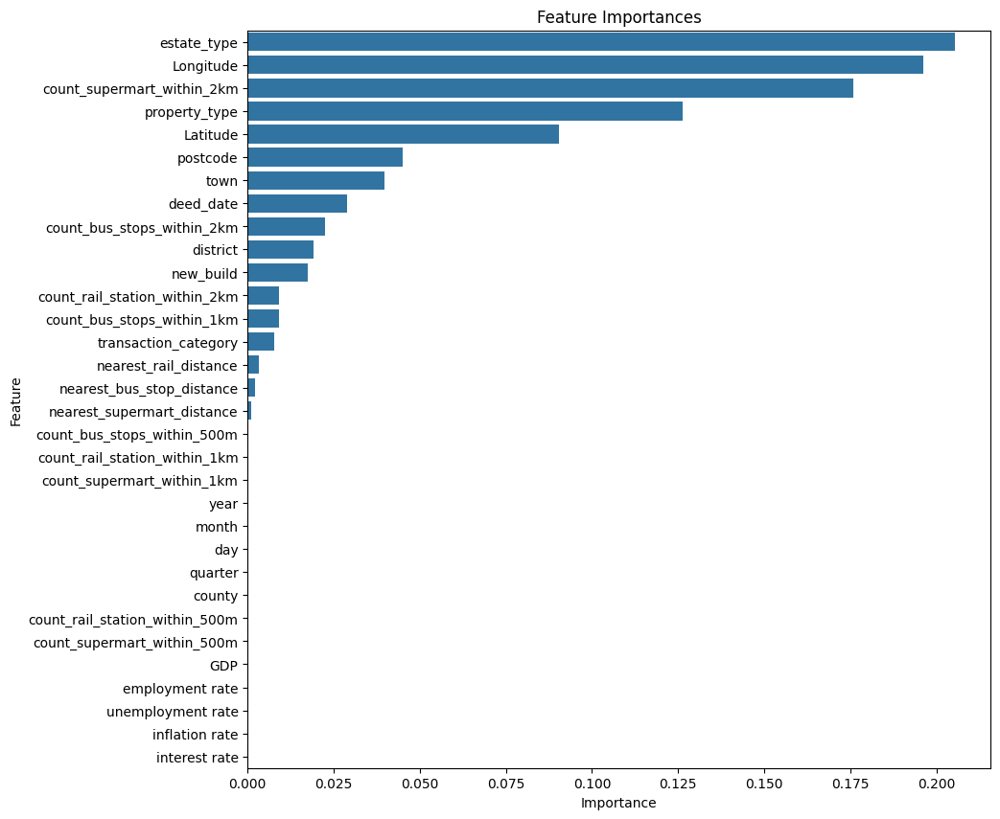

In [ ]:
# Obtain feature importances
feature_importances = gb_model.feature_importances_

# Create a DataFrame to store feature importances along with their names
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Visualize feature importances
plt.figure(figsize=(10, 10))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## **Cross validation**

In [ ]:
# Define custom scoring functions for R-squared, RMSE, MSE, and MAE
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

def mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Make scorer objects for each custom scoring function
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(rmse, greater_is_better=False)  # RMSE is better when lower
mse_scorer = make_scorer(mse, greater_is_better=False)    # MSE is better when lower
mae_scorer = make_scorer(mae, greater_is_better=False)    # MAE is better when lower

# Perform cross-validation with custom scoring functions
cv_r2 = cross_val_score(gb_model, X_train, y_train, cv=5, scoring=r2_scorer)
cv_rmse = -cross_val_score(gb_model, X_train, y_train, cv=5, scoring=rmse_scorer)
cv_mse = -cross_val_score(gb_model, X_train, y_train, cv=5, scoring=mse_scorer)
cv_mae = -cross_val_score(gb_model, X_train, y_train, cv=5, scoring=mae_scorer)

# Print the cross-validation scores
print("Cross-Validation R-squared:", cv_r2)
print("Mean R-squared:", np.mean(cv_r2))
print("Cross-Validation RMSE:", cv_rmse)
print("Mean RMSE:", np.mean(cv_rmse))
print("Cross-Validation MSE:", cv_mse)
print("Mean MSE:", np.mean(cv_mse))
print("Cross-Validation MAE:", cv_mae)
print("Mean MAE:", np.mean(cv_mae))

Cross-Validation R-squared: [0.48453167 0.50732693 0.46133884 0.45596602 0.46122358]
Mean R-squared: 0.4740774078018385
Cross-Validation RMSE: [212730.52770082 206695.25455947 219755.98645029 220032.64744822
 224485.2164784 ]
Mean RMSE: 216739.92652744072
Cross-Validation MSE: [4.52542774e+10 4.27229283e+10 4.82926936e+10 4.84143659e+10
 5.03936124e+10]
Mean MSE: 47015575522.88835
Cross-Validation MAE: [148219.57554201 136560.62759526 144346.1557695  145238.50840473
 149368.62720756]
Mean MAE: 144746.6989038117


In [ ]:
import pandas as pd

# Define the scores for each model
scores = [
    {"Default_Model": "Linear Regression", "R-squared": 0.26, "RMSE": 271325, "MSE": 73617192326, "MAE": 191584},
    {"Default_Model": "XGBoost", "R-squared": 0.53, "RMSE": 216040, "MSE": 46673438837, "MAE": 143841},
    {"Default_Model": "Random Forest", "R-squared": 0.66, "RMSE": 184666, "MSE": 34101668716, "MAE": 120770},
    {"Default_Model": "Decision Tree", "R-squared": 0.27, "RMSE": 268447, "MSE": 72063746775, "MAE": 172318},
    {"Default_Model": "Gradient Boosting", "R-squared": 0.46, "RMSE": 232387, "MSE": 54003658847, "MAE": 153994}
]


# Convert scores to DataFrame
df_scores = pd.DataFrame(scores)

# Define colors for each model
color_mapping = {
    "Linear Regression": "lightblue",
    "XGBoost": "lightgreen",
    "Random Forest": "lightpink",
    "Decision Tree": "lightyellow",
    "Gradient Boosting": "lightcyan"
}

# Sort the DataFrame by R-squared in descending order
df_sorted = df_scores.sort_values(by='RMSE', ascending=True)

# Define function to apply background color based on model
def colorize(row):
    model = row["Default_Model"]
    color = color_mapping.get(model, "white")  # Default to white if model not found in mapping
    return [f'background-color: {color}'] * len(row)

# Apply colorize function to each row
df_styled = df_scores.style.apply(colorize, axis=1)

# Display styled DataFrame
df_styled

,Default_Model,R-squared,RMSE,MSE,MAE
0,Linear Regression,0.260000,271325,73617192326,191584
1,XGBoost,0.530000,216040,46673438837,143841
2,Random Forest,0.660000,184666,34101668716,120770
3,Decision Tree,0.270000,268447,72063746775,172318
4,Gradient Boosting,0.460000,232387,54003658847,153994


In [ ]:
import pandas as pd
import numpy as np

# Define the scores for each model
scores = [
    {"Optimized_Model": "XGBoost", "R-squared": 0.61, "RMSE": 197368, "MSE": 38953942063, "MAE": 131680},
    {"Optimized_Model": "Random Forest Regressor", "R-squared": 0.62, "RMSE": 193327, "MSE": 37375511303, "MAE": 127629},
    {"Optimized_Model": "Decision Tree Regressor", "R-squared": 0.53, "RMSE": 216538, "MSE": 46888898114, "MAE": 142628}
]


# Convert scores to DataFrame
df_scores = pd.DataFrame(scores)

# Define colors for each model
color_mapping = {
    "XGBoost": "lightblue",
    "Random Forest Regressor": "lightgreen",
    "Decision Tree Regressor": "lightpink"
}

# Sort the DataFrame by R-squared in descending order
df_sorted = df_scores.sort_values(by='RMSE', ascending=True)

# Define function to apply background color based on model
def colorize(row):
    model = row["Optimized_Model"]
    color = color_mapping.get(model, "white")  # Default to white if model not found in mapping
    return [f'background-color: {color}'] * len(row)

# Apply colorize function to each row
df_styled = df_scores.style.apply(colorize, axis=1)


# Display styled DataFrame
df_styled

,Optimized_Model,R-squared,RMSE,MSE,MAE
0,XGBoost,0.610000,197368,38953942063,131680
1,Random Forest Regressor,0.620000,193327,37375511303,127629
2,Decision Tree Regressor,0.530000,216538,46888898114,142628
